In [15]:
import numpy as np
from matplotlib import pyplot as plt
import math
from math import exp, sqrt, pi
import time

import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset,RandomSampler

from mpl_toolkits import mplot3d

In [25]:
device = torch.device("cpu")

n = 100 

r = 0.05;gamma = 0.05
sigma = 0.3;T = 1

x_start = -np.exp(sigma*np.sqrt(T));x_end = np.exp(sigma*np.sqrt(T))
t_start = 0.;t_end = 1.

x = np.linspace(x_start,x_end,100 )
t = np.linspace(t_start,t_end,100 )
x, t = np.meshgrid(x, t)
x = np.reshape(x, (np.size(x[:]),1))
t = np.reshape(t, (np.size(t[:]),1))

x_left = np.linspace(x_start,x_start, 100 )
t_left = np.linspace(t_start,t_end, 100 ) 
v_left = np.zeros(100)
x_left = x_left.reshape(-1, 1)
t_left = t_left.reshape(-1, 1)
v_left = v_left.reshape(-1, 1)

x_up = np.linspace(x_start,x_end, 100 )
t_up = np.linspace(t_end,t_end, 100 ) 
v_up = (x_up > 0)*x_up
x_up = x_up.reshape(-1, 1)
t_up = t_up.reshape(-1, 1)
v_up = v_up.reshape(-1, 1)

x_right = np.linspace(x_end,x_end, 100 )
t_right = np.linspace(t_start,t_end, 100 ) 
v_right = np.exp(-r*(T-t_right))
x_right = x_right.reshape(-1, 1)
t_right = t_right.reshape(-1, 1)
v_right = v_right.reshape(-1, 1)


x_bound = [x_left,x_up,x_right]
t_bound = [t_left,t_up,t_right]
v_bound = [v_left,v_up,v_right]

xnet = torch.Tensor(x).to(device)
tnet = torch.Tensor(t).to(device) 

In [26]:
def train(device,x,t,x_bound,t_bound,v_bound,learning_rate,basis_num,epochs,batch_flag,batch_size):

	xnet = torch.Tensor(x).to(device)
	tnet = torch.Tensor(t).to(device) 
	x_left,x_up,x_right = x_bound
	t_left,t_up,t_right = t_bound
	V_left,V_up,V_right = v_bound

	x_left = torch.Tensor(x_left).to(device) 	
	t_left = torch.Tensor(t_left).to(device) 	
	V_left = torch.Tensor(V_left).to(device)
	x_up = torch.Tensor(x_up).to(device) 	
	t_up = torch.Tensor(t_up).to(device) 	
	V_up = torch.Tensor(V_up).to(device)
	x_right = torch.Tensor(x_right).to(device) 	
	t_right = torch.Tensor(t_right).to(device) 	
	V_right = torch.Tensor(V_right).to(device)

	if(batch_flag):
		dataset = TensorDataset(xnet,tnet)
		dataloader = DataLoader(dataset, batch_size=batch_size,shuffle=True,num_workers = 0,drop_last = True )
		print(len(dataloader))

	def lag_coeffs(num):
		lis = [np.array([1]),np.array([1,-1])]
		for n in range(1,num-1):
			xl1 = np.concatenate((np.array([0]),lis[n]),axis = 0)
			l1 = np.concatenate((lis[n],np.array([0])),axis = 0)		
			l0 = np.concatenate((lis[n-1],np.array([0,0])),axis = 0)
			l = ((2*n + 1)*l1 - xl1 - n*l0)/(n + 1)
			lis.append(l)
		for n in range(num):
			lis[n] = np.concatenate((lis[n],np.array([0]*(num-1-n))),axis = 0)
		return lis

	def poly(coeffs,x):
		sum = torch.zeros_like(x)
		for i,coeff in enumerate(coeffs):
			sum = sum + coeff*(x**i)
		return sum

	class Net(nn.Module):
		def __init__(self):
			super(Net, self).__init__()
			self.main = nn.Sequential(
				#nn.Linear(2*basis_num,2*basis_num),
				nn.Linear(2*basis_num,1)
			)		
		def forward(self,input):
			coeffs = lag_coeffs(basis_num)
			x = input[:,0]
			t = input[:,1]
			netin = torch.Tensor([])
			#print(input)
			for i in range(basis_num):
				netin = torch.cat((netin,poly(coeffs[i],x.view(-1,1))),1)
			for i in range(basis_num):
				netin = torch.cat((netin,poly(coeffs[i],t.view(-1,1))),1)
			#print(netin)
			netout = self.main(netin)
			return netout

	net = Net().to(device)
	
	def init_normal(m):
		if type(m) == nn.Linear:
			nn.init.kaiming_normal_(m.weight)

	net.apply(init_normal)

	optimizer = optim.Adam(net.parameters(), lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)

	def Loss_criterion(xnet,tnet):
		xnet.requires_grad = True
		tnet.requires_grad = True
		points = torch.cat((xnet,tnet),1) 
		V = net(points)
		V = V.view(len(V),-1)
		V_x = torch.autograd.grad(V,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		V_xx = torch.autograd.grad(V_x,xnet,grad_outputs=torch.ones_like(xnet),create_graph = True,only_inputs=True)[0]
		V_t = torch.autograd.grad(V,tnet,grad_outputs=torch.ones_like(tnet),create_graph = True,only_inputs=True)[0]
		u = ((r - gamma)*V_x - xnet*(sigma**2)*V_xx > 0).long()
		loss = V_t + (u - xnet)*(r - gamma)*V_x + ((u - xnet)**2)*(sigma**2)*V_xx/2 - gamma * V
		return nn.MSELoss()(loss,torch.zeros_like(loss)) 

	def Loss_BC(x_left,t_left,V_left,x_up,t_up,V_up,x_right,t_right,V_right):
		x_right.requires_grad = True
		left = torch.cat((x_left, t_left), 1)
		out = net(left)
		V_left_pred = out.view(len(out), -1)
		loss_f = nn.MSELoss()
		loss_left = loss_f(V_left_pred,V_left)

		up = torch.cat((x_up, t_up), 1)
		out = net(up)
		V_up_pred = out.view(len(out), -1)
		loss_f = nn.MSELoss()
		loss_up = loss_f(V_up_pred,V_up)
		
		right = torch.cat((x_right, t_right), 1)
		out = net(right)
		V_right_pred = out.view(len(out), -1)
		Vx_right_pred = torch.autograd.grad(V_right_pred,x_right,grad_outputs=torch.ones_like(x_right),create_graph = True,only_inputs=True)[0]
		loss_f = nn.MSELoss()
		loss_right = loss_f(Vx_right_pred,V_right)

		loss_bc = loss_right + loss_left + loss_up
		return loss_bc,loss_right,loss_left,loss_up


	losses = []
	tic = time.time()

	xx = np.linspace(-np.exp(sigma*np.sqrt(T)),np.exp(sigma*np.sqrt(T)),100);tt = np.linspace(0.,1.,100)
	xx,tt = np.meshgrid(xx,tt)

	if(batch_flag):
		for epoch in range(epochs):
			if epoch == 50:
				learning_rate = 0.00001
				new_optimizer = optim.Adam(net.parameters(), lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)
				optimizer = new_optimizer
			for batch_idx, (x_in,t_in) in enumerate(dataloader):

				net.zero_grad()
				loss_eqn = Loss_criterion(x_in,t_in)
				loss_bc,loss_right,loss_left,loss_up = Loss_BC(x_left,t_left,V_left,x_up,t_up,V_up,x_right,t_right,V_right)
				loss = loss_eqn + loss_bc
				loss.backward()

				optimizer.step() 
				if batch_idx % 20 ==0:
					print('\nTrain Epoch: {} \tLoss: {:.10f}\tEquation Loss: {:.10f} \t BC Loss {:.6f}\nRight_boundary loss {:.10f}\tLeft_boundary loss {:.10f}\tUp_boundary loss {:.10f}\n'.format(epoch, loss.item(),loss_eqn.item(),loss_bc.item(),loss_right.item(),loss_left.item(),loss_up.item()))

					
			points = torch.cat((xnet,tnet),1)
			U = net(points)
			z = U.detach().numpy()

			if epoch % 1 == 0:
				ax = plt.axes(projection='3d')
				ax.plot_surface(xx,tt,z.reshape(100,100))
				plt.show()
			#if epoch % 50 == 0:
			#	print('Train Epoch: {} \tLoss: {:.10f}\tEquation Loss: {:.10f} \t BC Loss {:.6f}'.format(epoch, loss.item(),loss_eqn.item(),loss_bc.item()))
			#losses.append(loss.item())
					
	else:
		for epoch in range(epochs):
			if epoch == 2000:
				learning_rate = 0.00001
				new_optimizer = optim.Adam(net.parameters(), lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)
				optimizer = new_optimizer
			net.zero_grad()
			loss_eqn = Loss_criterion(xnet,tnet)
			loss_bc,loss_right,loss_left,loss_up = Loss_BC(x_left,t_left,V_left,x_up,t_up,V_up,x_right,t_right,V_right)
			loss = loss_eqn + loss_bc
			loss.backward()
			
			optimizer.step() 
			points = torch.cat((xnet,tnet),1)
			U = net(points)
			z = U.detach().numpy()

			if epoch % 50 == 0:
				ax = plt.axes(projection='3d')
				ax.plot_surface(xx,tt,z.reshape(100,100))
				plt.show()
			if epoch % 10 == 0:
				print('\nTrain Epoch: {} \tLoss: {:.10f}\tEquation Loss: {:.10f} \t BC Loss {:.6f}\nRight_boundary loss {:.10f}\tLeft_boundary loss {:.10f}\tUp_boundary loss {:.10f}\n'.format(epoch, loss.item(),loss_eqn.item(),loss_bc.item(),loss_right.item(),loss_left.item(),loss_up.item()))
			
			losses.append(loss.item())

	toc = time.time()
	elapseTime = toc - tic
	print ("elapse time in parallel = ", elapseTime)

	net_in = torch.cat((xnet,tnet),1)
	output = net(net_in)  #evaluate model
	
	pred = net(torch.cat((x_up, t_up), 1))
	V_up_pred = pred.view(len(pred), -1)

	return output,V_up_pred


78

Train Epoch: 0 	Loss: 307.3602905273	Equation Loss: 5.9836068153 	 BC Loss 301.376678
Right_boundary loss 0.0065687965	Left_boundary loss 273.5780944824	Up_boundary loss 27.7920284271


Train Epoch: 0 	Loss: 124.3069076538	Equation Loss: 4.2563114166 	 BC Loss 120.050598
Right_boundary loss 0.0002037810	Left_boundary loss 108.9822845459	Up_boundary loss 11.0681037903


Train Epoch: 0 	Loss: 33.9367523193	Equation Loss: 2.7975888252 	 BC Loss 31.139162
Right_boundary loss 0.0044033085	Left_boundary loss 28.1813373566	Up_boundary loss 2.9534204006


Train Epoch: 0 	Loss: 5.9472470284	Equation Loss: 1.7835788727 	 BC Loss 4.163668
Right_boundary loss 0.0120677473	Left_boundary loss 3.5830490589	Up_boundary loss 0.5685513020



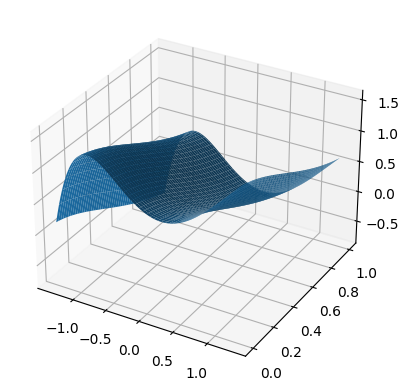


Train Epoch: 1 	Loss: 1.8539459705	Equation Loss: 1.3366231918 	 BC Loss 0.517323
Right_boundary loss 0.0167199112	Left_boundary loss 0.2081961632	Up_boundary loss 0.2924066782


Train Epoch: 1 	Loss: 1.5322363377	Equation Loss: 1.1081522703 	 BC Loss 0.424084
Right_boundary loss 0.0182886198	Left_boundary loss 0.1047381982	Up_boundary loss 0.3010571897


Train Epoch: 1 	Loss: 1.5599259138	Equation Loss: 1.1817920208 	 BC Loss 0.378134
Right_boundary loss 0.0180183463	Left_boundary loss 0.0761568472	Up_boundary loss 0.2839586735


Train Epoch: 1 	Loss: 1.4278074503	Equation Loss: 1.0889190435 	 BC Loss 0.338888
Right_boundary loss 0.0176207256	Left_boundary loss 0.0568914264	Up_boundary loss 0.2643762529



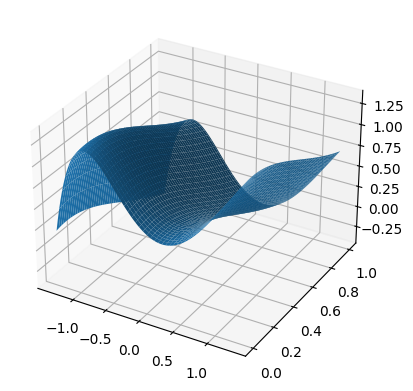


Train Epoch: 2 	Loss: 1.1230369806	Equation Loss: 0.8028659225 	 BC Loss 0.320171
Right_boundary loss 0.0174913909	Left_boundary loss 0.0489160977	Up_boundary loss 0.2537635565


Train Epoch: 2 	Loss: 1.1343499422	Equation Loss: 0.8306633234 	 BC Loss 0.303687
Right_boundary loss 0.0174429268	Left_boundary loss 0.0402711667	Up_boundary loss 0.2459725440


Train Epoch: 2 	Loss: 0.9900041819	Equation Loss: 0.7004451752 	 BC Loss 0.289559
Right_boundary loss 0.0173809659	Left_boundary loss 0.0329739675	Up_boundary loss 0.2392041087


Train Epoch: 2 	Loss: 0.7785301805	Equation Loss: 0.5009543896 	 BC Loss 0.277576
Right_boundary loss 0.0172968227	Left_boundary loss 0.0272586010	Up_boundary loss 0.2330203652



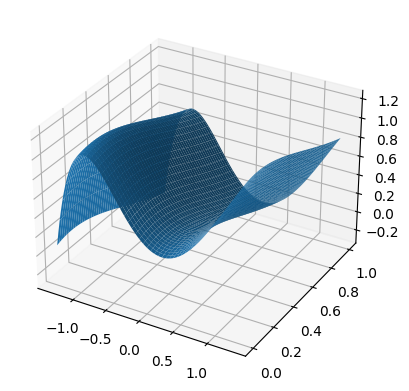


Train Epoch: 3 	Loss: 0.8712747097	Equation Loss: 0.6026111245 	 BC Loss 0.268664
Right_boundary loss 0.0172218103	Left_boundary loss 0.0229270477	Up_boundary loss 0.2285146862


Train Epoch: 3 	Loss: 0.7566915154	Equation Loss: 0.4961110950 	 BC Loss 0.260580
Right_boundary loss 0.0171470270	Left_boundary loss 0.0186529905	Up_boundary loss 0.2247804105


Train Epoch: 3 	Loss: 0.5872826576	Equation Loss: 0.3329386711 	 BC Loss 0.254344
Right_boundary loss 0.0170735195	Left_boundary loss 0.0151574155	Up_boundary loss 0.2221130878


Train Epoch: 3 	Loss: 0.5397232175	Equation Loss: 0.2900823355 	 BC Loss 0.249641
Right_boundary loss 0.0169962831	Left_boundary loss 0.0125630638	Up_boundary loss 0.2200815231



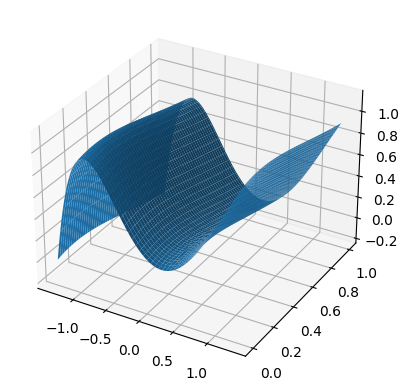


Train Epoch: 4 	Loss: 0.4613192976	Equation Loss: 0.2147708535 	 BC Loss 0.246548
Right_boundary loss 0.0169363953	Left_boundary loss 0.0105760871	Up_boundary loss 0.2190359682


Train Epoch: 4 	Loss: 0.5556688309	Equation Loss: 0.3116853833 	 BC Loss 0.243983
Right_boundary loss 0.0168649796	Left_boundary loss 0.0091165742	Up_boundary loss 0.2180018574


Train Epoch: 4 	Loss: 0.4332276583	Equation Loss: 0.1911561638 	 BC Loss 0.242071
Right_boundary loss 0.0167980790	Left_boundary loss 0.0080086114	Up_boundary loss 0.2172647864


Train Epoch: 4 	Loss: 0.4433408976	Equation Loss: 0.2027328461 	 BC Loss 0.240608
Right_boundary loss 0.0167406630	Left_boundary loss 0.0070885434	Up_boundary loss 0.2167788297



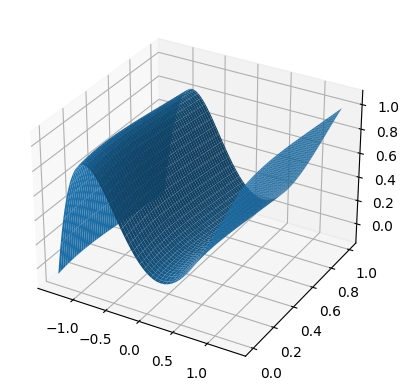


Train Epoch: 5 	Loss: 0.3763420582	Equation Loss: 0.1370665133 	 BC Loss 0.239276
Right_boundary loss 0.0166807733	Left_boundary loss 0.0070490306	Up_boundary loss 0.2155457437


Train Epoch: 5 	Loss: 0.4754304886	Equation Loss: 0.2378001809 	 BC Loss 0.237630
Right_boundary loss 0.0166287236	Left_boundary loss 0.0064790118	Up_boundary loss 0.2145225704


Train Epoch: 5 	Loss: 0.4016062617	Equation Loss: 0.1661319584 	 BC Loss 0.235474
Right_boundary loss 0.0165593699	Left_boundary loss 0.0069773551	Up_boundary loss 0.2119375616


Train Epoch: 5 	Loss: 0.3242239952	Equation Loss: 0.0915222168 	 BC Loss 0.232702
Right_boundary loss 0.0164964050	Left_boundary loss 0.0069836215	Up_boundary loss 0.2092217654



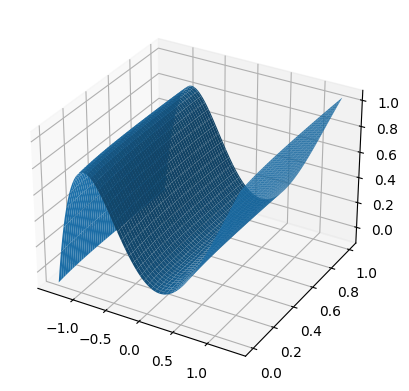


Train Epoch: 6 	Loss: 0.3776859045	Equation Loss: 0.1482270807 	 BC Loss 0.229459
Right_boundary loss 0.0164351370	Left_boundary loss 0.0068346215	Up_boundary loss 0.2061890662


Train Epoch: 6 	Loss: 0.3303178847	Equation Loss: 0.1051419973 	 BC Loss 0.225176
Right_boundary loss 0.0163534377	Left_boundary loss 0.0068497402	Up_boundary loss 0.2019727081


Train Epoch: 6 	Loss: 0.3231485188	Equation Loss: 0.1033454761 	 BC Loss 0.219803
Right_boundary loss 0.0162549000	Left_boundary loss 0.0066582607	Up_boundary loss 0.1968898922


Train Epoch: 6 	Loss: 0.2729275227	Equation Loss: 0.0592519417 	 BC Loss 0.213676
Right_boundary loss 0.0161268655	Left_boundary loss 0.0067485301	Up_boundary loss 0.1908001900



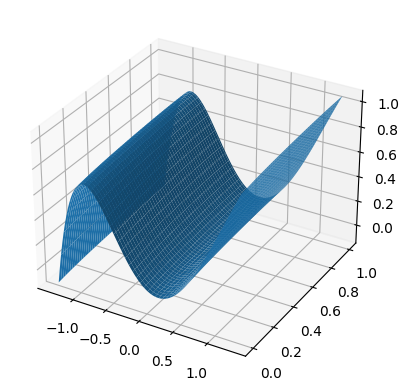


Train Epoch: 7 	Loss: 0.3153557777	Equation Loss: 0.1078926921 	 BC Loss 0.207463
Right_boundary loss 0.0159776565	Left_boundary loss 0.0071358476	Up_boundary loss 0.1843495965


Train Epoch: 7 	Loss: 0.3137048483	Equation Loss: 0.1136783510 	 BC Loss 0.200027
Right_boundary loss 0.0158014726	Left_boundary loss 0.0062057311	Up_boundary loss 0.1780193001


Train Epoch: 7 	Loss: 0.2603844106	Equation Loss: 0.0683106259 	 BC Loss 0.192074
Right_boundary loss 0.0155620612	Left_boundary loss 0.0060575567	Up_boundary loss 0.1704541594


Train Epoch: 7 	Loss: 0.2591719031	Equation Loss: 0.0754037499 	 BC Loss 0.183768
Right_boundary loss 0.0152737340	Left_boundary loss 0.0056631910	Up_boundary loss 0.1628312469



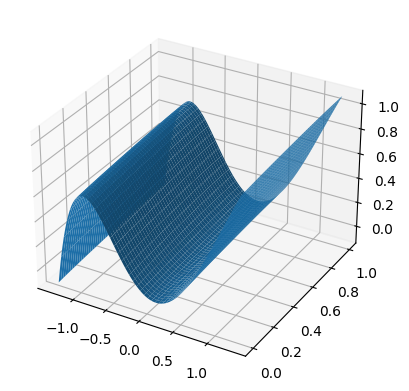


Train Epoch: 8 	Loss: 0.2360986173	Equation Loss: 0.0603242740 	 BC Loss 0.175774
Right_boundary loss 0.0149504188	Left_boundary loss 0.0058119907	Up_boundary loss 0.1550119370


Train Epoch: 8 	Loss: 0.2334479988	Equation Loss: 0.0668848529 	 BC Loss 0.166563
Right_boundary loss 0.0145412795	Left_boundary loss 0.0050994009	Up_boundary loss 0.1469224542


Train Epoch: 8 	Loss: 0.2305366993	Equation Loss: 0.0735604465 	 BC Loss 0.156976
Right_boundary loss 0.0140370652	Left_boundary loss 0.0052166851	Up_boundary loss 0.1377225071


Train Epoch: 8 	Loss: 0.2408933938	Equation Loss: 0.0935175866 	 BC Loss 0.147376
Right_boundary loss 0.0134678222	Left_boundary loss 0.0049613942	Up_boundary loss 0.1289465874



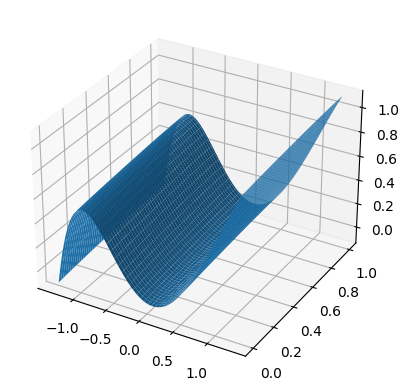


Train Epoch: 9 	Loss: 0.1954645962	Equation Loss: 0.0570688955 	 BC Loss 0.138396
Right_boundary loss 0.0128843738	Left_boundary loss 0.0049713580	Up_boundary loss 0.1205399707


Train Epoch: 9 	Loss: 0.1914454997	Equation Loss: 0.0633310452 	 BC Loss 0.128114
Right_boundary loss 0.0121679949	Left_boundary loss 0.0044068713	Up_boundary loss 0.1115395799


Train Epoch: 9 	Loss: 0.1693670303	Equation Loss: 0.0517172180 	 BC Loss 0.117650
Right_boundary loss 0.0113672707	Left_boundary loss 0.0039519574	Up_boundary loss 0.1023305878


Train Epoch: 9 	Loss: 0.1721126735	Equation Loss: 0.0649368912 	 BC Loss 0.107176
Right_boundary loss 0.0104907276	Left_boundary loss 0.0037015590	Up_boundary loss 0.0929834917



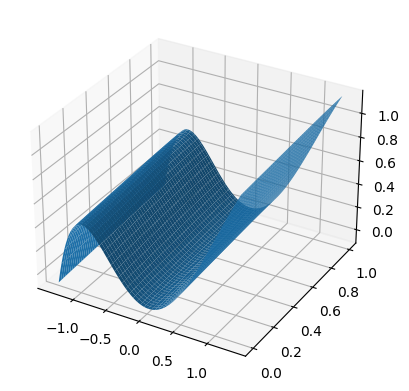


Train Epoch: 10 	Loss: 0.1825837940	Equation Loss: 0.0847452432 	 BC Loss 0.097839
Right_boundary loss 0.0096488064	Left_boundary loss 0.0034150176	Up_boundary loss 0.0847747251


Train Epoch: 10 	Loss: 0.1409476846	Equation Loss: 0.0532594733 	 BC Loss 0.087688
Right_boundary loss 0.0086723110	Left_boundary loss 0.0033014633	Up_boundary loss 0.0757144392


Train Epoch: 10 	Loss: 0.1123630181	Equation Loss: 0.0350381285 	 BC Loss 0.077325
Right_boundary loss 0.0076736254	Left_boundary loss 0.0023301512	Up_boundary loss 0.0673211142


Train Epoch: 10 	Loss: 0.1152991802	Equation Loss: 0.0477458946 	 BC Loss 0.067553
Right_boundary loss 0.0066305925	Left_boundary loss 0.0025606339	Up_boundary loss 0.0583620630



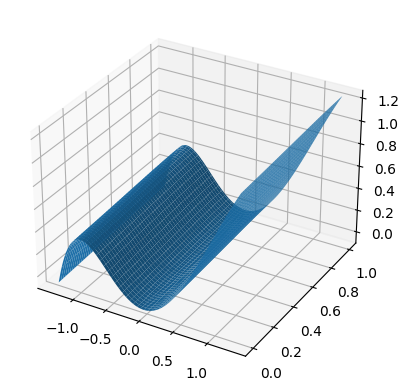


Train Epoch: 11 	Loss: 0.1451999247	Equation Loss: 0.0859746635 	 BC Loss 0.059225
Right_boundary loss 0.0057122265	Left_boundary loss 0.0024333999	Up_boundary loss 0.0510796271


Train Epoch: 11 	Loss: 0.0959188417	Equation Loss: 0.0454505309 	 BC Loss 0.050468
Right_boundary loss 0.0047349944	Left_boundary loss 0.0019091957	Up_boundary loss 0.0438241214


Train Epoch: 11 	Loss: 0.0856518745	Equation Loss: 0.0430396907 	 BC Loss 0.042612
Right_boundary loss 0.0038203227	Left_boundary loss 0.0016247752	Up_boundary loss 0.0371670872


Train Epoch: 11 	Loss: 0.0691346526	Equation Loss: 0.0338591486 	 BC Loss 0.035276
Right_boundary loss 0.0029843068	Left_boundary loss 0.0016144047	Up_boundary loss 0.0306767896



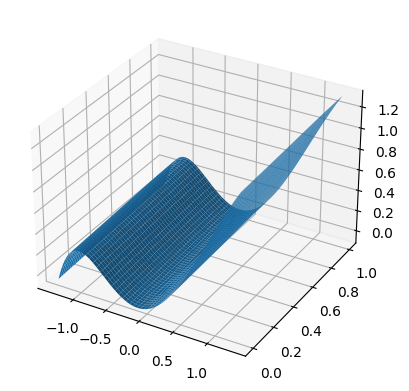


Train Epoch: 12 	Loss: 0.0682359487	Equation Loss: 0.0387385897 	 BC Loss 0.029497
Right_boundary loss 0.0023151853	Left_boundary loss 0.0011892692	Up_boundary loss 0.0259929076


Train Epoch: 12 	Loss: 0.0609198958	Equation Loss: 0.0369991288 	 BC Loss 0.023921
Right_boundary loss 0.0016633928	Left_boundary loss 0.0009570494	Up_boundary loss 0.0213003270


Train Epoch: 12 	Loss: 0.0655245036	Equation Loss: 0.0461392850 	 BC Loss 0.019385
Right_boundary loss 0.0011297320	Left_boundary loss 0.0009191981	Up_boundary loss 0.0173362922


Train Epoch: 12 	Loss: 0.0476297736	Equation Loss: 0.0319159925 	 BC Loss 0.015714
Right_boundary loss 0.0007242314	Left_boundary loss 0.0006283107	Up_boundary loss 0.0143612381



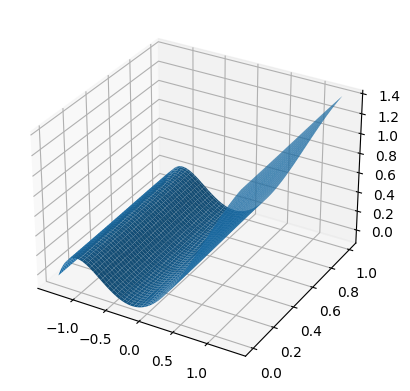


Train Epoch: 13 	Loss: 0.0351268798	Equation Loss: 0.0221038796 	 BC Loss 0.013023
Right_boundary loss 0.0004620829	Left_boundary loss 0.0004654425	Up_boundary loss 0.0120954728


Train Epoch: 13 	Loss: 0.0243841223	Equation Loss: 0.0135141229 	 BC Loss 0.010870
Right_boundary loss 0.0002805708	Left_boundary loss 0.0002487829	Up_boundary loss 0.0103406450


Train Epoch: 13 	Loss: 0.0365974829	Equation Loss: 0.0267854128 	 BC Loss 0.009812
Right_boundary loss 0.0002082729	Left_boundary loss 0.0003062058	Up_boundary loss 0.0092975916


Train Epoch: 13 	Loss: 0.0451368615	Equation Loss: 0.0362316296 	 BC Loss 0.008905
Right_boundary loss 0.0002136440	Left_boundary loss 0.0002055666	Up_boundary loss 0.0084860232



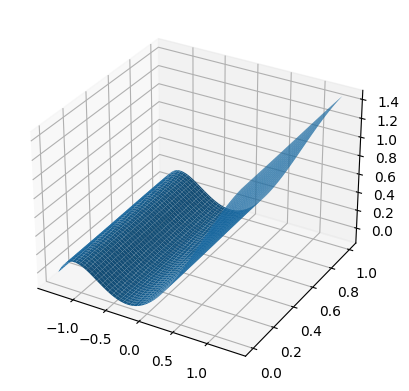


Train Epoch: 14 	Loss: 0.0359808914	Equation Loss: 0.0273790434 	 BC Loss 0.008602
Right_boundary loss 0.0002701572	Left_boundary loss 0.0001227131	Up_boundary loss 0.0082089780


Train Epoch: 14 	Loss: 0.0335959904	Equation Loss: 0.0251523126 	 BC Loss 0.008444
Right_boundary loss 0.0003779689	Left_boundary loss 0.0002533046	Up_boundary loss 0.0078124050


Train Epoch: 14 	Loss: 0.0290366448	Equation Loss: 0.0205937698 	 BC Loss 0.008443
Right_boundary loss 0.0005009589	Left_boundary loss 0.0001200781	Up_boundary loss 0.0078218393


Train Epoch: 14 	Loss: 0.0334960930	Equation Loss: 0.0248631220 	 BC Loss 0.008633
Right_boundary loss 0.0006198891	Left_boundary loss 0.0002373933	Up_boundary loss 0.0077756876



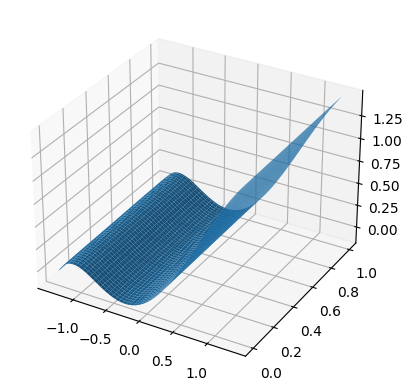


Train Epoch: 15 	Loss: 0.0379897356	Equation Loss: 0.0292403437 	 BC Loss 0.008749
Right_boundary loss 0.0006989056	Left_boundary loss 0.0001216329	Up_boundary loss 0.0079288511


Train Epoch: 15 	Loss: 0.0291769914	Equation Loss: 0.0202036686 	 BC Loss 0.008973
Right_boundary loss 0.0007856901	Left_boundary loss 0.0001401638	Up_boundary loss 0.0080474690


Train Epoch: 15 	Loss: 0.0289683230	Equation Loss: 0.0198789984 	 BC Loss 0.009089
Right_boundary loss 0.0008490272	Left_boundary loss 0.0001348720	Up_boundary loss 0.0081054252


Train Epoch: 15 	Loss: 0.0319169573	Equation Loss: 0.0229834095 	 BC Loss 0.008934
Right_boundary loss 0.0009119859	Left_boundary loss 0.0000799703	Up_boundary loss 0.0079415925



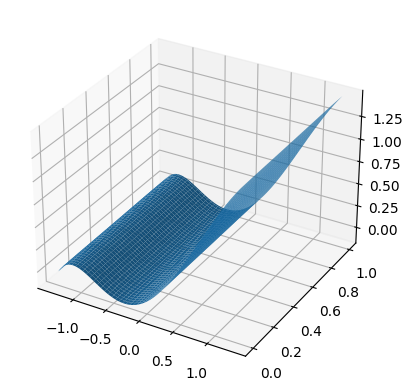


Train Epoch: 16 	Loss: 0.0358962379	Equation Loss: 0.0270400550 	 BC Loss 0.008856
Right_boundary loss 0.0009264715	Left_boundary loss 0.0001423110	Up_boundary loss 0.0077873995


Train Epoch: 16 	Loss: 0.0315682739	Equation Loss: 0.0224871822 	 BC Loss 0.009081
Right_boundary loss 0.0009082053	Left_boundary loss 0.0005412428	Up_boundary loss 0.0076316418


Train Epoch: 16 	Loss: 0.0304271635	Equation Loss: 0.0216592513 	 BC Loss 0.008768
Right_boundary loss 0.0008951373	Left_boundary loss 0.0001504768	Up_boundary loss 0.0077222977


Train Epoch: 16 	Loss: 0.0216872431	Equation Loss: 0.0128881931 	 BC Loss 0.008799
Right_boundary loss 0.0009145417	Left_boundary loss 0.0001204303	Up_boundary loss 0.0077640773



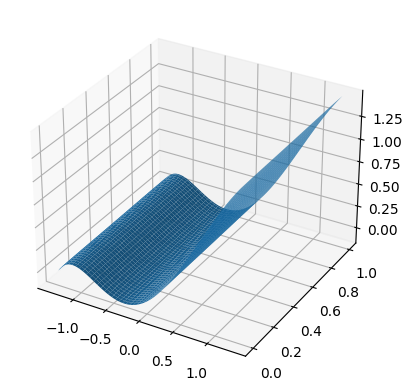


Train Epoch: 17 	Loss: 0.0309060607	Equation Loss: 0.0223591644 	 BC Loss 0.008547
Right_boundary loss 0.0009199927	Left_boundary loss 0.0000418735	Up_boundary loss 0.0075850300


Train Epoch: 17 	Loss: 0.0243629143	Equation Loss: 0.0159667805 	 BC Loss 0.008396
Right_boundary loss 0.0008739445	Left_boundary loss 0.0000365796	Up_boundary loss 0.0074856090


Train Epoch: 17 	Loss: 0.0238360595	Equation Loss: 0.0156199913 	 BC Loss 0.008216
Right_boundary loss 0.0008746831	Left_boundary loss 0.0001278020	Up_boundary loss 0.0072135832


Train Epoch: 17 	Loss: 0.0214329697	Equation Loss: 0.0134140858 	 BC Loss 0.008019
Right_boundary loss 0.0008472275	Left_boundary loss 0.0001384526	Up_boundary loss 0.0070332047



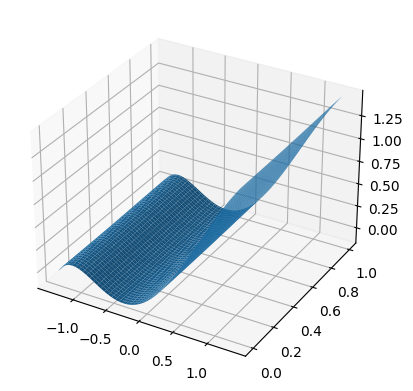


Train Epoch: 18 	Loss: 0.0231342725	Equation Loss: 0.0151657294 	 BC Loss 0.007969
Right_boundary loss 0.0008479877	Left_boundary loss 0.0000591767	Up_boundary loss 0.0070613790


Train Epoch: 18 	Loss: 0.0288798474	Equation Loss: 0.0211156625 	 BC Loss 0.007764
Right_boundary loss 0.0008386036	Left_boundary loss 0.0000389291	Up_boundary loss 0.0068866527


Train Epoch: 18 	Loss: 0.0369525515	Equation Loss: 0.0288508106 	 BC Loss 0.008102
Right_boundary loss 0.0007981873	Left_boundary loss 0.0002019590	Up_boundary loss 0.0071015949


Train Epoch: 18 	Loss: 0.0201684758	Equation Loss: 0.0124025270 	 BC Loss 0.007766
Right_boundary loss 0.0008331362	Left_boundary loss 0.0001104343	Up_boundary loss 0.0068223788



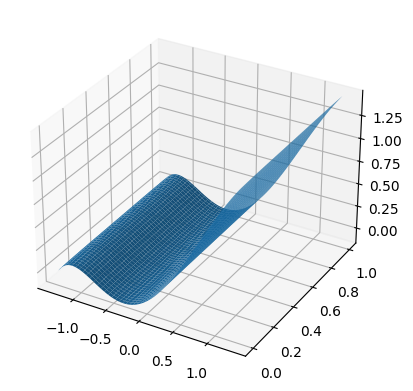


Train Epoch: 19 	Loss: 0.0265869461	Equation Loss: 0.0190560110 	 BC Loss 0.007531
Right_boundary loss 0.0008144602	Left_boundary loss 0.0001056850	Up_boundary loss 0.0066107898


Train Epoch: 19 	Loss: 0.0286834072	Equation Loss: 0.0214654319 	 BC Loss 0.007218
Right_boundary loss 0.0007764292	Left_boundary loss 0.0001202152	Up_boundary loss 0.0063213315


Train Epoch: 19 	Loss: 0.0298933368	Equation Loss: 0.0226430707 	 BC Loss 0.007250
Right_boundary loss 0.0007878979	Left_boundary loss 0.0003657815	Up_boundary loss 0.0060965861


Train Epoch: 19 	Loss: 0.0232626162	Equation Loss: 0.0161302052 	 BC Loss 0.007132
Right_boundary loss 0.0007943665	Left_boundary loss 0.0000439321	Up_boundary loss 0.0062941117



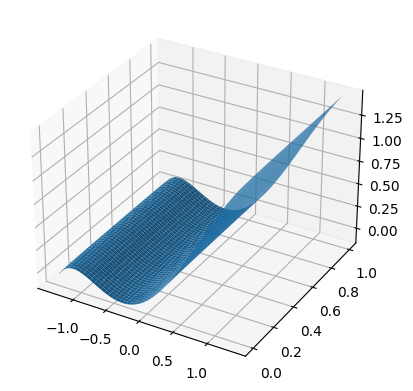


Train Epoch: 20 	Loss: 0.0250143129	Equation Loss: 0.0176014677 	 BC Loss 0.007413
Right_boundary loss 0.0008166803	Left_boundary loss 0.0010633667	Up_boundary loss 0.0055327984


Train Epoch: 20 	Loss: 0.0244203135	Equation Loss: 0.0177661646 	 BC Loss 0.006654
Right_boundary loss 0.0007250541	Left_boundary loss 0.0000800262	Up_boundary loss 0.0058490695


Train Epoch: 20 	Loss: 0.0221166983	Equation Loss: 0.0155596565 	 BC Loss 0.006557
Right_boundary loss 0.0007246973	Left_boundary loss 0.0001009056	Up_boundary loss 0.0057314378


Train Epoch: 20 	Loss: 0.0232809372	Equation Loss: 0.0167031642 	 BC Loss 0.006578
Right_boundary loss 0.0007166059	Left_boundary loss 0.0000709982	Up_boundary loss 0.0057901680



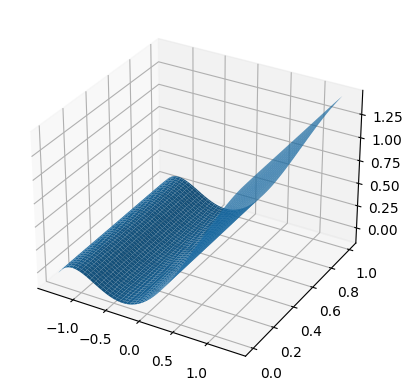


Train Epoch: 21 	Loss: 0.0244006775	Equation Loss: 0.0179006420 	 BC Loss 0.006500
Right_boundary loss 0.0007198961	Left_boundary loss 0.0003537955	Up_boundary loss 0.0054263449


Train Epoch: 21 	Loss: 0.0217566006	Equation Loss: 0.0155219231 	 BC Loss 0.006235
Right_boundary loss 0.0007261124	Left_boundary loss 0.0002034104	Up_boundary loss 0.0053051547


Train Epoch: 21 	Loss: 0.0202105716	Equation Loss: 0.0140253659 	 BC Loss 0.006185
Right_boundary loss 0.0007101590	Left_boundary loss 0.0003416656	Up_boundary loss 0.0051333811


Train Epoch: 21 	Loss: 0.0214837771	Equation Loss: 0.0155635700 	 BC Loss 0.005920
Right_boundary loss 0.0006821000	Left_boundary loss 0.0002452651	Up_boundary loss 0.0049928427



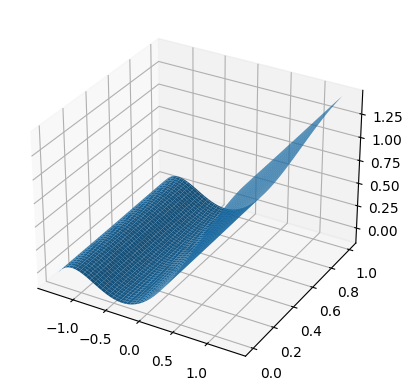


Train Epoch: 22 	Loss: 0.0163993705	Equation Loss: 0.0104063665 	 BC Loss 0.005993
Right_boundary loss 0.0006612238	Left_boundary loss 0.0002093121	Up_boundary loss 0.0051224683


Train Epoch: 22 	Loss: 0.0210359674	Equation Loss: 0.0151684340 	 BC Loss 0.005868
Right_boundary loss 0.0006895978	Left_boundary loss 0.0000531589	Up_boundary loss 0.0051247771


Train Epoch: 22 	Loss: 0.0198994018	Equation Loss: 0.0141374161 	 BC Loss 0.005762
Right_boundary loss 0.0006992192	Left_boundary loss 0.0001347942	Up_boundary loss 0.0049279714


Train Epoch: 22 	Loss: 0.0186638013	Equation Loss: 0.0131039228 	 BC Loss 0.005560
Right_boundary loss 0.0006719022	Left_boundary loss 0.0000291273	Up_boundary loss 0.0048588486



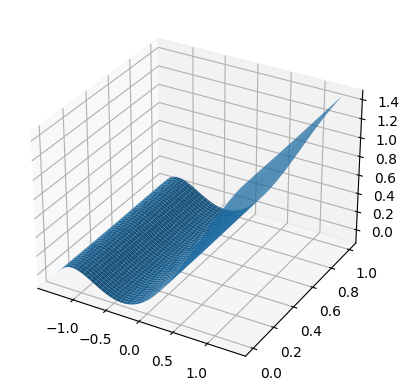


Train Epoch: 23 	Loss: 0.0173760261	Equation Loss: 0.0119194817 	 BC Loss 0.005457
Right_boundary loss 0.0006467537	Left_boundary loss 0.0000426206	Up_boundary loss 0.0047671702


Train Epoch: 23 	Loss: 0.0207900517	Equation Loss: 0.0149795590 	 BC Loss 0.005810
Right_boundary loss 0.0005992447	Left_boundary loss 0.0002884147	Up_boundary loss 0.0049228333


Train Epoch: 23 	Loss: 0.0170700885	Equation Loss: 0.0118828379 	 BC Loss 0.005187
Right_boundary loss 0.0006352870	Left_boundary loss 0.0001814694	Up_boundary loss 0.0043704952


Train Epoch: 23 	Loss: 0.0229664966	Equation Loss: 0.0178749785 	 BC Loss 0.005092
Right_boundary loss 0.0005912684	Left_boundary loss 0.0000427715	Up_boundary loss 0.0044574793



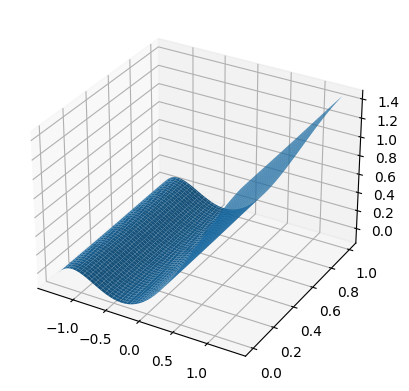


Train Epoch: 24 	Loss: 0.0232477225	Equation Loss: 0.0180209447 	 BC Loss 0.005227
Right_boundary loss 0.0005950302	Left_boundary loss 0.0002457516	Up_boundary loss 0.0043859966


Train Epoch: 24 	Loss: 0.0183072127	Equation Loss: 0.0131732980 	 BC Loss 0.005134
Right_boundary loss 0.0006283931	Left_boundary loss 0.0000736622	Up_boundary loss 0.0044318601


Train Epoch: 24 	Loss: 0.0238640159	Equation Loss: 0.0190152619 	 BC Loss 0.004849
Right_boundary loss 0.0005966078	Left_boundary loss 0.0000234695	Up_boundary loss 0.0042286776


Train Epoch: 24 	Loss: 0.0228112675	Equation Loss: 0.0179518145 	 BC Loss 0.004859
Right_boundary loss 0.0005694774	Left_boundary loss 0.0000483944	Up_boundary loss 0.0042415811



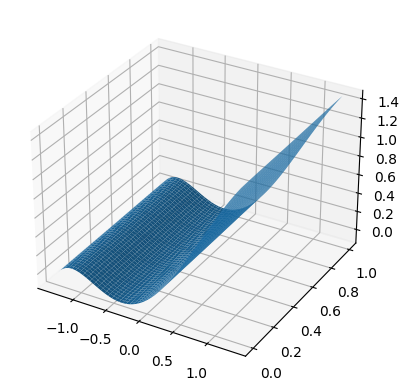


Train Epoch: 25 	Loss: 0.0174845438	Equation Loss: 0.0126630543 	 BC Loss 0.004821
Right_boundary loss 0.0005946335	Left_boundary loss 0.0000483245	Up_boundary loss 0.0041785319


Train Epoch: 25 	Loss: 0.0157396737	Equation Loss: 0.0108253388 	 BC Loss 0.004914
Right_boundary loss 0.0005900256	Left_boundary loss 0.0005734580	Up_boundary loss 0.0037508511


Train Epoch: 25 	Loss: 0.0187354460	Equation Loss: 0.0142048672 	 BC Loss 0.004531
Right_boundary loss 0.0005592396	Left_boundary loss 0.0001708036	Up_boundary loss 0.0038005367


Train Epoch: 25 	Loss: 0.0165629387	Equation Loss: 0.0117590018 	 BC Loss 0.004804
Right_boundary loss 0.0005497196	Left_boundary loss 0.0001903332	Up_boundary loss 0.0040638847



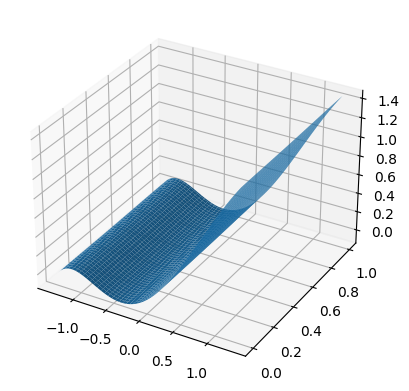


Train Epoch: 26 	Loss: 0.0226237085	Equation Loss: 0.0181896240 	 BC Loss 0.004434
Right_boundary loss 0.0005660040	Left_boundary loss 0.0000174757	Up_boundary loss 0.0038506046


Train Epoch: 26 	Loss: 0.0165655520	Equation Loss: 0.0120774582 	 BC Loss 0.004488
Right_boundary loss 0.0005591473	Left_boundary loss 0.0002764445	Up_boundary loss 0.0036525025


Train Epoch: 26 	Loss: 0.0177462138	Equation Loss: 0.0134058539 	 BC Loss 0.004340
Right_boundary loss 0.0005557613	Left_boundary loss 0.0000543169	Up_boundary loss 0.0037302808


Train Epoch: 26 	Loss: 0.0182797313	Equation Loss: 0.0140434289 	 BC Loss 0.004236
Right_boundary loss 0.0005492220	Left_boundary loss 0.0002626609	Up_boundary loss 0.0034244198



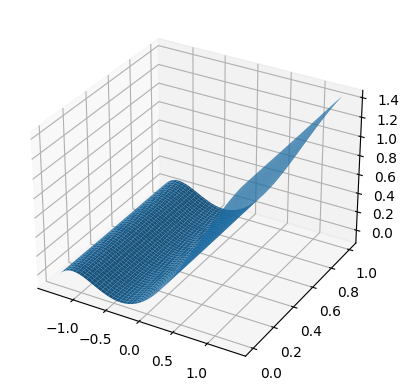


Train Epoch: 27 	Loss: 0.0218190178	Equation Loss: 0.0175130665 	 BC Loss 0.004306
Right_boundary loss 0.0005343314	Left_boundary loss 0.0005152736	Up_boundary loss 0.0032563452


Train Epoch: 27 	Loss: 0.0146167362	Equation Loss: 0.0106066540 	 BC Loss 0.004010
Right_boundary loss 0.0004930910	Left_boundary loss 0.0000615640	Up_boundary loss 0.0034554275


Train Epoch: 27 	Loss: 0.0206262246	Equation Loss: 0.0166662708 	 BC Loss 0.003960
Right_boundary loss 0.0005041984	Left_boundary loss 0.0002311574	Up_boundary loss 0.0032245971


Train Epoch: 27 	Loss: 0.0152053759	Equation Loss: 0.0113548953 	 BC Loss 0.003850
Right_boundary loss 0.0005155329	Left_boundary loss 0.0000300277	Up_boundary loss 0.0033049197



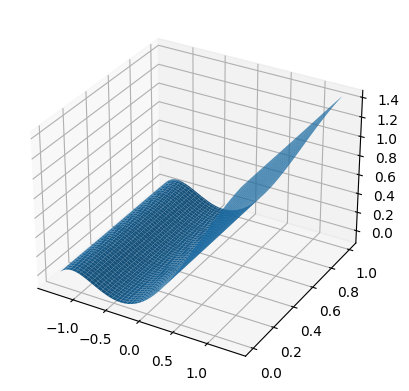


Train Epoch: 28 	Loss: 0.0158618968	Equation Loss: 0.0121406317 	 BC Loss 0.003721
Right_boundary loss 0.0005176360	Left_boundary loss 0.0000082708	Up_boundary loss 0.0031953580


Train Epoch: 28 	Loss: 0.0155470911	Equation Loss: 0.0117406398 	 BC Loss 0.003806
Right_boundary loss 0.0004952032	Left_boundary loss 0.0001775452	Up_boundary loss 0.0031337028


Train Epoch: 28 	Loss: 0.0159652233	Equation Loss: 0.0122345565 	 BC Loss 0.003731
Right_boundary loss 0.0004855367	Left_boundary loss 0.0001364422	Up_boundary loss 0.0031086875


Train Epoch: 28 	Loss: 0.0187146366	Equation Loss: 0.0151302163 	 BC Loss 0.003584
Right_boundary loss 0.0004621291	Left_boundary loss 0.0001911896	Up_boundary loss 0.0029311008



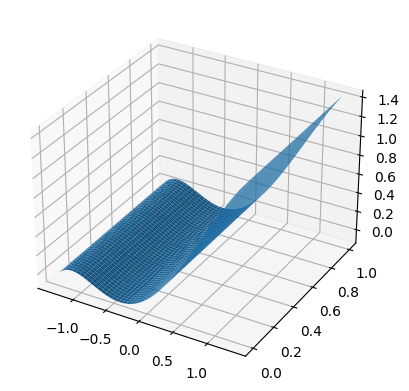


Train Epoch: 29 	Loss: 0.0132919690	Equation Loss: 0.0097253909 	 BC Loss 0.003567
Right_boundary loss 0.0004712326	Left_boundary loss 0.0000535832	Up_boundary loss 0.0030417619


Train Epoch: 29 	Loss: 0.0142366076	Equation Loss: 0.0108054392 	 BC Loss 0.003431
Right_boundary loss 0.0005045818	Left_boundary loss 0.0000210314	Up_boundary loss 0.0029055553


Train Epoch: 29 	Loss: 0.0160479713	Equation Loss: 0.0126553029 	 BC Loss 0.003393
Right_boundary loss 0.0004528348	Left_boundary loss 0.0000496969	Up_boundary loss 0.0028901363


Train Epoch: 29 	Loss: 0.0135226520	Equation Loss: 0.0101511758 	 BC Loss 0.003371
Right_boundary loss 0.0004480343	Left_boundary loss 0.0000724200	Up_boundary loss 0.0028510222



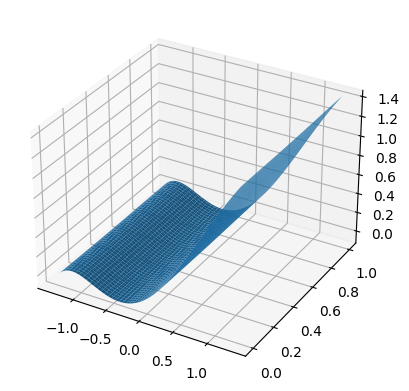


Train Epoch: 30 	Loss: 0.0145352390	Equation Loss: 0.0112332338 	 BC Loss 0.003302
Right_boundary loss 0.0004749978	Left_boundary loss 0.0001188102	Up_boundary loss 0.0027081969


Train Epoch: 30 	Loss: 0.0130704259	Equation Loss: 0.0097519187 	 BC Loss 0.003319
Right_boundary loss 0.0004580916	Left_boundary loss 0.0001222692	Up_boundary loss 0.0027381466


Train Epoch: 30 	Loss: 0.0133925220	Equation Loss: 0.0100931088 	 BC Loss 0.003299
Right_boundary loss 0.0004743819	Left_boundary loss 0.0002373158	Up_boundary loss 0.0025877154


Train Epoch: 30 	Loss: 0.0131129045	Equation Loss: 0.0101055764 	 BC Loss 0.003007
Right_boundary loss 0.0004464370	Left_boundary loss 0.0000386120	Up_boundary loss 0.0025222790



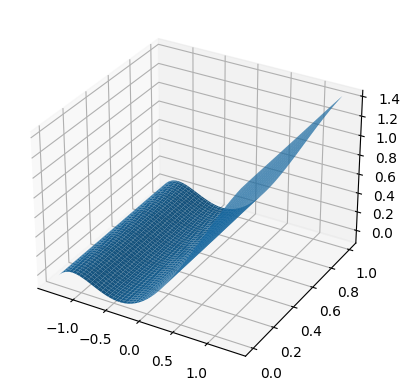


Train Epoch: 31 	Loss: 0.0166238789	Equation Loss: 0.0133565599 	 BC Loss 0.003267
Right_boundary loss 0.0004277972	Left_boundary loss 0.0004300532	Up_boundary loss 0.0024094679


Train Epoch: 31 	Loss: 0.0141441282	Equation Loss: 0.0109018451 	 BC Loss 0.003242
Right_boundary loss 0.0004296055	Left_boundary loss 0.0004012970	Up_boundary loss 0.0024113811


Train Epoch: 31 	Loss: 0.0119573269	Equation Loss: 0.0090009868 	 BC Loss 0.002956
Right_boundary loss 0.0004315385	Left_boundary loss 0.0000229456	Up_boundary loss 0.0025018558


Train Epoch: 31 	Loss: 0.0129379956	Equation Loss: 0.0099155605 	 BC Loss 0.003022
Right_boundary loss 0.0004204068	Left_boundary loss 0.0000866690	Up_boundary loss 0.0025153595



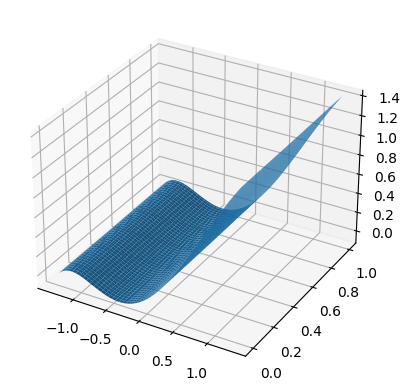


Train Epoch: 32 	Loss: 0.0163743906	Equation Loss: 0.0135050071 	 BC Loss 0.002869
Right_boundary loss 0.0004064140	Left_boundary loss 0.0000155796	Up_boundary loss 0.0024473898


Train Epoch: 32 	Loss: 0.0143769849	Equation Loss: 0.0114997737 	 BC Loss 0.002877
Right_boundary loss 0.0004261850	Left_boundary loss 0.0001464488	Up_boundary loss 0.0023045773


Train Epoch: 32 	Loss: 0.0130341686	Equation Loss: 0.0100895911 	 BC Loss 0.002945
Right_boundary loss 0.0004172014	Left_boundary loss 0.0001194897	Up_boundary loss 0.0024078859


Train Epoch: 32 	Loss: 0.0127320578	Equation Loss: 0.0101077594 	 BC Loss 0.002624
Right_boundary loss 0.0004057247	Left_boundary loss 0.0000094327	Up_boundary loss 0.0022091409



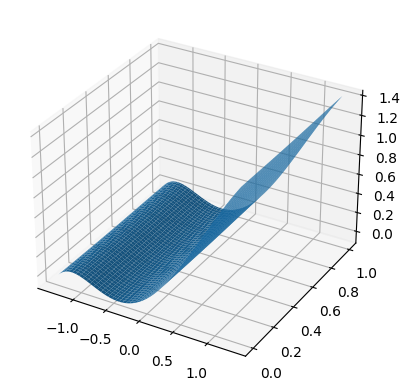


Train Epoch: 33 	Loss: 0.0134504754	Equation Loss: 0.0107494052 	 BC Loss 0.002701
Right_boundary loss 0.0003969859	Left_boundary loss 0.0001290552	Up_boundary loss 0.0021750291


Train Epoch: 33 	Loss: 0.0146633778	Equation Loss: 0.0120930988 	 BC Loss 0.002570
Right_boundary loss 0.0003981055	Left_boundary loss 0.0000284412	Up_boundary loss 0.0021437325


Train Epoch: 33 	Loss: 0.0136729842	Equation Loss: 0.0110080410 	 BC Loss 0.002665
Right_boundary loss 0.0003912228	Left_boundary loss 0.0000368294	Up_boundary loss 0.0022368913


Train Epoch: 33 	Loss: 0.0091159735	Equation Loss: 0.0065237661 	 BC Loss 0.002592
Right_boundary loss 0.0004094782	Left_boundary loss 0.0000215738	Up_boundary loss 0.0021611552



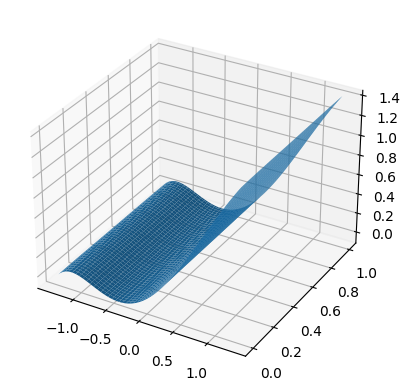


Train Epoch: 34 	Loss: 0.0134980585	Equation Loss: 0.0110155186 	 BC Loss 0.002483
Right_boundary loss 0.0003879284	Left_boundary loss 0.0000422179	Up_boundary loss 0.0020523933


Train Epoch: 34 	Loss: 0.0117988009	Equation Loss: 0.0092969285 	 BC Loss 0.002502
Right_boundary loss 0.0003649473	Left_boundary loss 0.0001499504	Up_boundary loss 0.0019869744


Train Epoch: 34 	Loss: 0.0118423989	Equation Loss: 0.0094938353 	 BC Loss 0.002349
Right_boundary loss 0.0003823195	Left_boundary loss 0.0000137059	Up_boundary loss 0.0019525385


Train Epoch: 34 	Loss: 0.0101032816	Equation Loss: 0.0076544005 	 BC Loss 0.002449
Right_boundary loss 0.0003657908	Left_boundary loss 0.0000370658	Up_boundary loss 0.0020460242



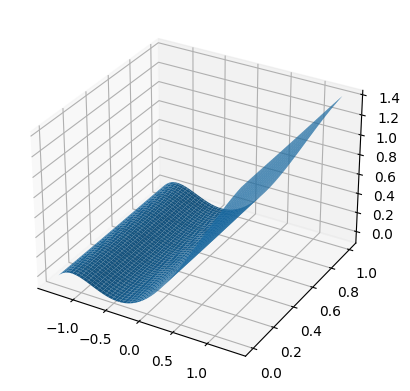


Train Epoch: 35 	Loss: 0.0111191291	Equation Loss: 0.0086809518 	 BC Loss 0.002438
Right_boundary loss 0.0003740495	Left_boundary loss 0.0001803213	Up_boundary loss 0.0018838065


Train Epoch: 35 	Loss: 0.0124330241	Equation Loss: 0.0099832453 	 BC Loss 0.002450
Right_boundary loss 0.0003643638	Left_boundary loss 0.0001026624	Up_boundary loss 0.0019827527


Train Epoch: 35 	Loss: 0.0117308265	Equation Loss: 0.0094291354 	 BC Loss 0.002302
Right_boundary loss 0.0003611255	Left_boundary loss 0.0001706253	Up_boundary loss 0.0017699401


Train Epoch: 35 	Loss: 0.0130797252	Equation Loss: 0.0106078144 	 BC Loss 0.002472
Right_boundary loss 0.0003478395	Left_boundary loss 0.0001311665	Up_boundary loss 0.0019929050



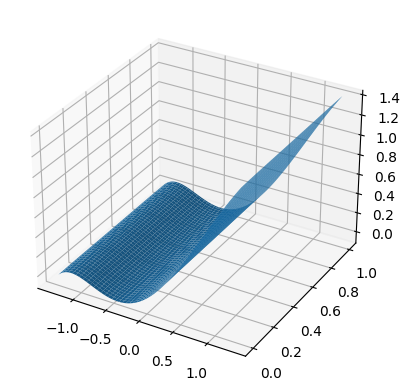


Train Epoch: 36 	Loss: 0.0116679240	Equation Loss: 0.0094397785 	 BC Loss 0.002228
Right_boundary loss 0.0003705561	Left_boundary loss 0.0000141420	Up_boundary loss 0.0018434476


Train Epoch: 36 	Loss: 0.0135796014	Equation Loss: 0.0113548022 	 BC Loss 0.002225
Right_boundary loss 0.0003621762	Left_boundary loss 0.0000379739	Up_boundary loss 0.0018246492


Train Epoch: 36 	Loss: 0.0104264626	Equation Loss: 0.0081948079 	 BC Loss 0.002232
Right_boundary loss 0.0003534908	Left_boundary loss 0.0001877307	Up_boundary loss 0.0016904330


Train Epoch: 36 	Loss: 0.0124370512	Equation Loss: 0.0101371258 	 BC Loss 0.002300
Right_boundary loss 0.0003381408	Left_boundary loss 0.0001315753	Up_boundary loss 0.0018302092



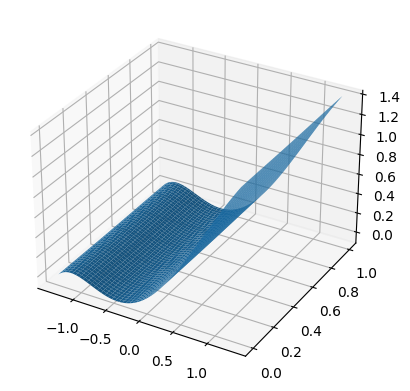


Train Epoch: 37 	Loss: 0.0115470821	Equation Loss: 0.0094464440 	 BC Loss 0.002101
Right_boundary loss 0.0003415448	Left_boundary loss 0.0000115326	Up_boundary loss 0.0017475605


Train Epoch: 37 	Loss: 0.0118824309	Equation Loss: 0.0097929081 	 BC Loss 0.002090
Right_boundary loss 0.0003500372	Left_boundary loss 0.0000281156	Up_boundary loss 0.0017113700


Train Epoch: 37 	Loss: 0.0109666027	Equation Loss: 0.0087511409 	 BC Loss 0.002215
Right_boundary loss 0.0003481619	Left_boundary loss 0.0002773913	Up_boundary loss 0.0015899086


Train Epoch: 37 	Loss: 0.0083039654	Equation Loss: 0.0059940591 	 BC Loss 0.002310
Right_boundary loss 0.0003391322	Left_boundary loss 0.0004184528	Up_boundary loss 0.0015523211



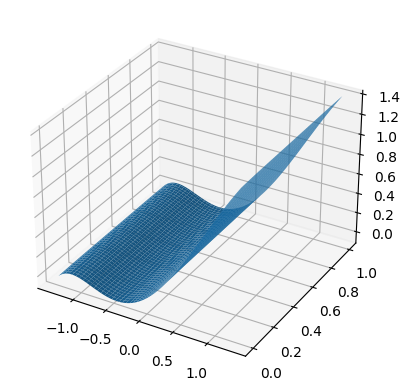


Train Epoch: 38 	Loss: 0.0102619156	Equation Loss: 0.0082552433 	 BC Loss 0.002007
Right_boundary loss 0.0003337078	Left_boundary loss 0.0001419498	Up_boundary loss 0.0015310146


Train Epoch: 38 	Loss: 0.0085784011	Equation Loss: 0.0065442715 	 BC Loss 0.002034
Right_boundary loss 0.0003208263	Left_boundary loss 0.0000997251	Up_boundary loss 0.0016135786


Train Epoch: 38 	Loss: 0.0104191145	Equation Loss: 0.0079738367 	 BC Loss 0.002445
Right_boundary loss 0.0003149672	Left_boundary loss 0.0005962107	Up_boundary loss 0.0015340996


Train Epoch: 38 	Loss: 0.0107666198	Equation Loss: 0.0088512106 	 BC Loss 0.001915
Right_boundary loss 0.0003371392	Left_boundary loss 0.0000435403	Up_boundary loss 0.0015347301



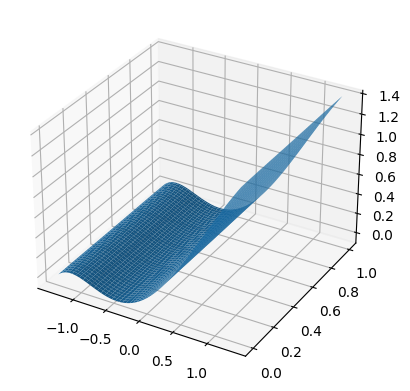


Train Epoch: 39 	Loss: 0.0086571984	Equation Loss: 0.0066660172 	 BC Loss 0.001991
Right_boundary loss 0.0003224038	Left_boundary loss 0.0001016255	Up_boundary loss 0.0015671521


Train Epoch: 39 	Loss: 0.0091513954	Equation Loss: 0.0073315809 	 BC Loss 0.001820
Right_boundary loss 0.0003149583	Left_boundary loss 0.0000371628	Up_boundary loss 0.0014676936


Train Epoch: 39 	Loss: 0.0111510698	Equation Loss: 0.0093271155 	 BC Loss 0.001824
Right_boundary loss 0.0003154500	Left_boundary loss 0.0000276523	Up_boundary loss 0.0014808518


Train Epoch: 39 	Loss: 0.0085873874	Equation Loss: 0.0066176206 	 BC Loss 0.001970
Right_boundary loss 0.0003157865	Left_boundary loss 0.0001286776	Up_boundary loss 0.0015253029



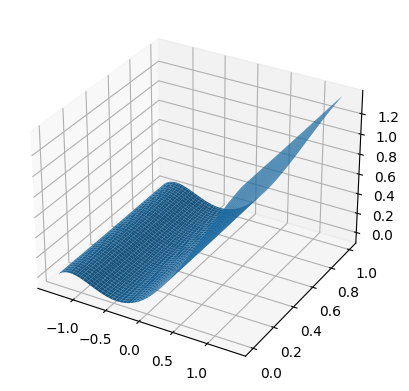


Train Epoch: 40 	Loss: 0.0111453384	Equation Loss: 0.0091418931 	 BC Loss 0.002003
Right_boundary loss 0.0003012247	Left_boundary loss 0.0001711039	Up_boundary loss 0.0015311171


Train Epoch: 40 	Loss: 0.0108688772	Equation Loss: 0.0090471925 	 BC Loss 0.001822
Right_boundary loss 0.0003153790	Left_boundary loss 0.0001299296	Up_boundary loss 0.0013763766


Train Epoch: 40 	Loss: 0.0095699579	Equation Loss: 0.0074837236 	 BC Loss 0.002086
Right_boundary loss 0.0003034241	Left_boundary loss 0.0002345226	Up_boundary loss 0.0015482880


Train Epoch: 40 	Loss: 0.0098478915	Equation Loss: 0.0080588227 	 BC Loss 0.001789
Right_boundary loss 0.0003066674	Left_boundary loss 0.0000799116	Up_boundary loss 0.0014024895



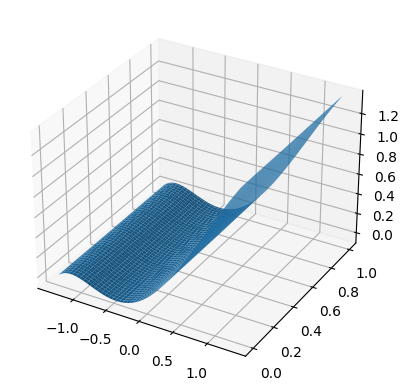


Train Epoch: 41 	Loss: 0.0086435555	Equation Loss: 0.0069292821 	 BC Loss 0.001714
Right_boundary loss 0.0002955091	Left_boundary loss 0.0000337664	Up_boundary loss 0.0013849975


Train Epoch: 41 	Loss: 0.0115417438	Equation Loss: 0.0098408740 	 BC Loss 0.001701
Right_boundary loss 0.0002917356	Left_boundary loss 0.0000313141	Up_boundary loss 0.0013778200


Train Epoch: 41 	Loss: 0.0069079683	Equation Loss: 0.0051961811 	 BC Loss 0.001712
Right_boundary loss 0.0003025100	Left_boundary loss 0.0000388812	Up_boundary loss 0.0013703961


Train Epoch: 41 	Loss: 0.0101030953	Equation Loss: 0.0085279169 	 BC Loss 0.001575
Right_boundary loss 0.0002933649	Left_boundary loss 0.0000076750	Up_boundary loss 0.0012741386



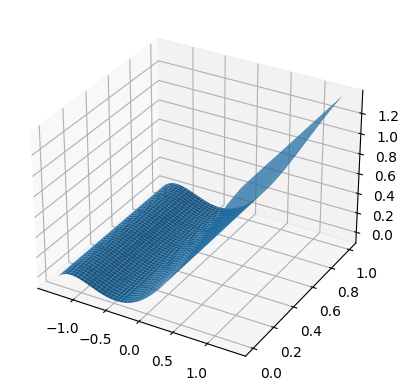


Train Epoch: 42 	Loss: 0.0093563246	Equation Loss: 0.0077272211 	 BC Loss 0.001629
Right_boundary loss 0.0002892603	Left_boundary loss 0.0000526693	Up_boundary loss 0.0012871742


Train Epoch: 42 	Loss: 0.0092984261	Equation Loss: 0.0072909789 	 BC Loss 0.002007
Right_boundary loss 0.0002947633	Left_boundary loss 0.0004782546	Up_boundary loss 0.0012344294


Train Epoch: 42 	Loss: 0.0094897430	Equation Loss: 0.0079305088 	 BC Loss 0.001559
Right_boundary loss 0.0002868876	Left_boundary loss 0.0000057833	Up_boundary loss 0.0012665631


Train Epoch: 42 	Loss: 0.0113924872	Equation Loss: 0.0097775375 	 BC Loss 0.001615
Right_boundary loss 0.0002823515	Left_boundary loss 0.0000285656	Up_boundary loss 0.0013040325



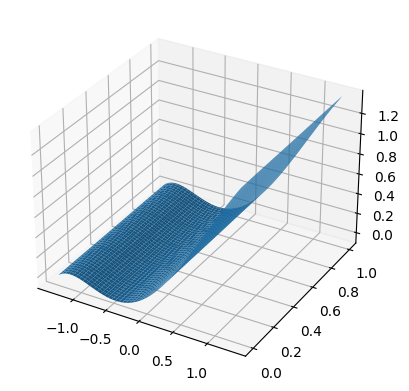


Train Epoch: 43 	Loss: 0.0067903996	Equation Loss: 0.0051480369 	 BC Loss 0.001642
Right_boundary loss 0.0002869040	Left_boundary loss 0.0000592579	Up_boundary loss 0.0012962008


Train Epoch: 43 	Loss: 0.0072714360	Equation Loss: 0.0056746760 	 BC Loss 0.001597
Right_boundary loss 0.0002782248	Left_boundary loss 0.0000434948	Up_boundary loss 0.0012750407


Train Epoch: 43 	Loss: 0.0073002656	Equation Loss: 0.0058001247 	 BC Loss 0.001500
Right_boundary loss 0.0002798979	Left_boundary loss 0.0000465360	Up_boundary loss 0.0011737068


Train Epoch: 43 	Loss: 0.0085034575	Equation Loss: 0.0068656662 	 BC Loss 0.001638
Right_boundary loss 0.0002774142	Left_boundary loss 0.0002017421	Up_boundary loss 0.0011586354



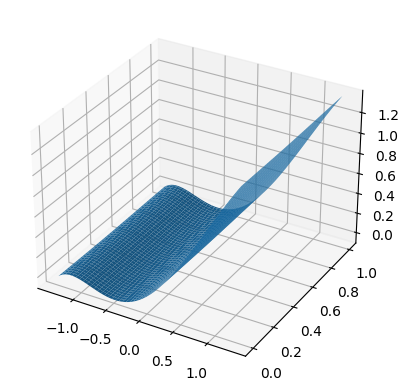


Train Epoch: 44 	Loss: 0.0078985458	Equation Loss: 0.0061487635 	 BC Loss 0.001750
Right_boundary loss 0.0002785567	Left_boundary loss 0.0002666296	Up_boundary loss 0.0012045961


Train Epoch: 44 	Loss: 0.0078903027	Equation Loss: 0.0062114443 	 BC Loss 0.001679
Right_boundary loss 0.0002743682	Left_boundary loss 0.0001267182	Up_boundary loss 0.0012777722


Train Epoch: 44 	Loss: 0.0081206467	Equation Loss: 0.0066738864 	 BC Loss 0.001447
Right_boundary loss 0.0002813494	Left_boundary loss 0.0000395441	Up_boundary loss 0.0011258672


Train Epoch: 44 	Loss: 0.0088370414	Equation Loss: 0.0071999072 	 BC Loss 0.001637
Right_boundary loss 0.0002606223	Left_boundary loss 0.0001302676	Up_boundary loss 0.0012462441



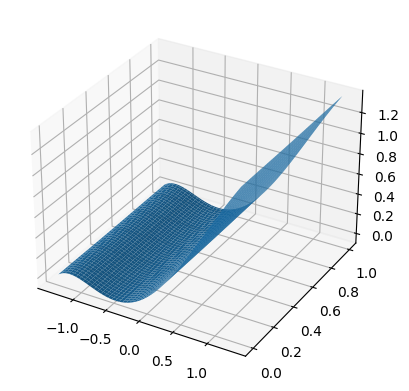


Train Epoch: 45 	Loss: 0.0089550912	Equation Loss: 0.0072417869 	 BC Loss 0.001713
Right_boundary loss 0.0002672095	Left_boundary loss 0.0002114910	Up_boundary loss 0.0012346036


Train Epoch: 45 	Loss: 0.0103441766	Equation Loss: 0.0089388080 	 BC Loss 0.001405
Right_boundary loss 0.0002700638	Left_boundary loss 0.0000069982	Up_boundary loss 0.0011283063


Train Epoch: 45 	Loss: 0.0097972210	Equation Loss: 0.0084014712 	 BC Loss 0.001396
Right_boundary loss 0.0002592042	Left_boundary loss 0.0000062336	Up_boundary loss 0.0011303116


Train Epoch: 45 	Loss: 0.0098184058	Equation Loss: 0.0083434936 	 BC Loss 0.001475
Right_boundary loss 0.0002634108	Left_boundary loss 0.0000981697	Up_boundary loss 0.0011133316



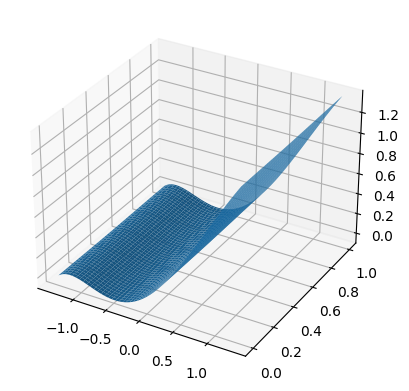


Train Epoch: 46 	Loss: 0.0081696846	Equation Loss: 0.0067591621 	 BC Loss 0.001411
Right_boundary loss 0.0002669570	Left_boundary loss 0.0000044524	Up_boundary loss 0.0011391131


Train Epoch: 46 	Loss: 0.0082469182	Equation Loss: 0.0064558084 	 BC Loss 0.001791
Right_boundary loss 0.0002690620	Left_boundary loss 0.0004538041	Up_boundary loss 0.0010682434


Train Epoch: 46 	Loss: 0.0079555372	Equation Loss: 0.0065629263 	 BC Loss 0.001393
Right_boundary loss 0.0002578596	Left_boundary loss 0.0000609261	Up_boundary loss 0.0010738252


Train Epoch: 46 	Loss: 0.0093241297	Equation Loss: 0.0079662818 	 BC Loss 0.001358
Right_boundary loss 0.0002521704	Left_boundary loss 0.0000099106	Up_boundary loss 0.0010957674



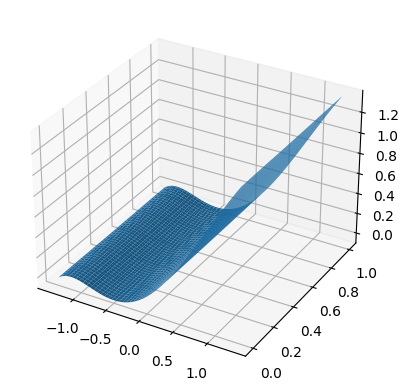


Train Epoch: 47 	Loss: 0.0079864804	Equation Loss: 0.0062238164 	 BC Loss 0.001763
Right_boundary loss 0.0002645972	Left_boundary loss 0.0004061119	Up_boundary loss 0.0010919549


Train Epoch: 47 	Loss: 0.0060959030	Equation Loss: 0.0047301473 	 BC Loss 0.001366
Right_boundary loss 0.0002621961	Left_boundary loss 0.0000152932	Up_boundary loss 0.0010882663


Train Epoch: 47 	Loss: 0.0066663097	Equation Loss: 0.0053274413 	 BC Loss 0.001339
Right_boundary loss 0.0002486511	Left_boundary loss 0.0000157211	Up_boundary loss 0.0010744963


Train Epoch: 47 	Loss: 0.0077966396	Equation Loss: 0.0063803112 	 BC Loss 0.001416
Right_boundary loss 0.0002464431	Left_boundary loss 0.0000620417	Up_boundary loss 0.0011078437



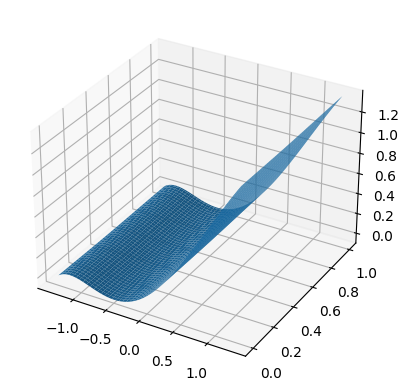


Train Epoch: 48 	Loss: 0.0099881459	Equation Loss: 0.0086275339 	 BC Loss 0.001361
Right_boundary loss 0.0002549239	Left_boundary loss 0.0000098365	Up_boundary loss 0.0010958518


Train Epoch: 48 	Loss: 0.0075202258	Equation Loss: 0.0059146290 	 BC Loss 0.001606
Right_boundary loss 0.0002636152	Left_boundary loss 0.0002913107	Up_boundary loss 0.0010506707


Train Epoch: 48 	Loss: 0.0063671451	Equation Loss: 0.0050485441 	 BC Loss 0.001319
Right_boundary loss 0.0002519356	Left_boundary loss 0.0000068402	Up_boundary loss 0.0010598250


Train Epoch: 48 	Loss: 0.0083124321	Equation Loss: 0.0070253331 	 BC Loss 0.001287
Right_boundary loss 0.0002469312	Left_boundary loss 0.0000045436	Up_boundary loss 0.0010356237



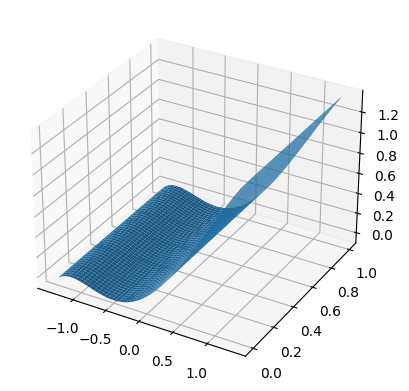


Train Epoch: 49 	Loss: 0.0069906008	Equation Loss: 0.0054582022 	 BC Loss 0.001532
Right_boundary loss 0.0002453503	Left_boundary loss 0.0002756469	Up_boundary loss 0.0010114014


Train Epoch: 49 	Loss: 0.0073605683	Equation Loss: 0.0057033561 	 BC Loss 0.001657
Right_boundary loss 0.0002393473	Left_boundary loss 0.0002811388	Up_boundary loss 0.0011367262


Train Epoch: 49 	Loss: 0.0099381842	Equation Loss: 0.0085323891 	 BC Loss 0.001406
Right_boundary loss 0.0002476339	Left_boundary loss 0.0001006305	Up_boundary loss 0.0010575306


Train Epoch: 49 	Loss: 0.0072031305	Equation Loss: 0.0059129628 	 BC Loss 0.001290
Right_boundary loss 0.0002441267	Left_boundary loss 0.0000093318	Up_boundary loss 0.0010367093



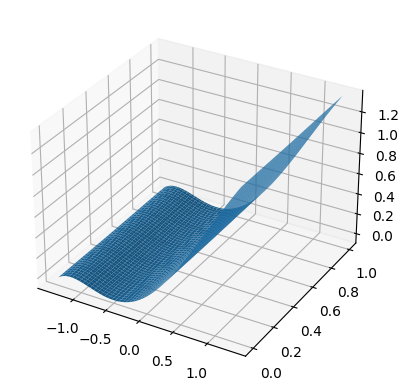


Train Epoch: 50 	Loss: 0.0080097569	Equation Loss: 0.0066375653 	 BC Loss 0.001372
Right_boundary loss 0.0002438816	Left_boundary loss 0.0001371583	Up_boundary loss 0.0009911518


Train Epoch: 50 	Loss: 0.0075438214	Equation Loss: 0.0062692869 	 BC Loss 0.001275
Right_boundary loss 0.0002425337	Left_boundary loss 0.0000254288	Up_boundary loss 0.0010065719


Train Epoch: 50 	Loss: 0.0058339047	Equation Loss: 0.0045641819 	 BC Loss 0.001270
Right_boundary loss 0.0002420913	Left_boundary loss 0.0000174854	Up_boundary loss 0.0010101460


Train Epoch: 50 	Loss: 0.0073997192	Equation Loss: 0.0061330455 	 BC Loss 0.001267
Right_boundary loss 0.0002417038	Left_boundary loss 0.0000119560	Up_boundary loss 0.0010130135



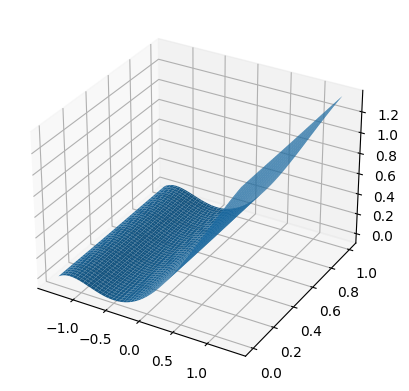


Train Epoch: 51 	Loss: 0.0080022356	Equation Loss: 0.0067353188 	 BC Loss 0.001267
Right_boundary loss 0.0002413406	Left_boundary loss 0.0000094366	Up_boundary loss 0.0010161395


Train Epoch: 51 	Loss: 0.0061430377	Equation Loss: 0.0048775990 	 BC Loss 0.001265
Right_boundary loss 0.0002413093	Left_boundary loss 0.0000098519	Up_boundary loss 0.0010142775


Train Epoch: 51 	Loss: 0.0060420483	Equation Loss: 0.0047735972 	 BC Loss 0.001268
Right_boundary loss 0.0002412735	Left_boundary loss 0.0000140489	Up_boundary loss 0.0010131286


Train Epoch: 51 	Loss: 0.0068916511	Equation Loss: 0.0056239734 	 BC Loss 0.001268
Right_boundary loss 0.0002408737	Left_boundary loss 0.0000082421	Up_boundary loss 0.0010185618



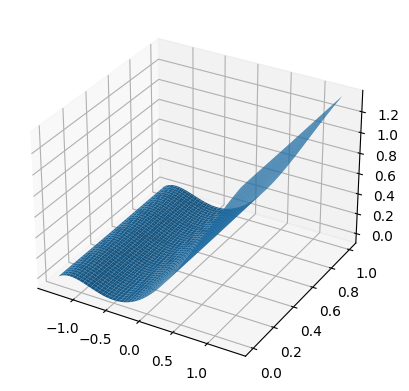


Train Epoch: 52 	Loss: 0.0067595541	Equation Loss: 0.0054940814 	 BC Loss 0.001265
Right_boundary loss 0.0002411217	Left_boundary loss 0.0000107715	Up_boundary loss 0.0010135795


Train Epoch: 52 	Loss: 0.0082920045	Equation Loss: 0.0070295245 	 BC Loss 0.001262
Right_boundary loss 0.0002412273	Left_boundary loss 0.0000109567	Up_boundary loss 0.0010102963


Train Epoch: 52 	Loss: 0.0065921335	Equation Loss: 0.0053336453 	 BC Loss 0.001258
Right_boundary loss 0.0002413167	Left_boundary loss 0.0000085683	Up_boundary loss 0.0010086033


Train Epoch: 52 	Loss: 0.0071999063	Equation Loss: 0.0059411568 	 BC Loss 0.001259
Right_boundary loss 0.0002409093	Left_boundary loss 0.0000083866	Up_boundary loss 0.0010094536



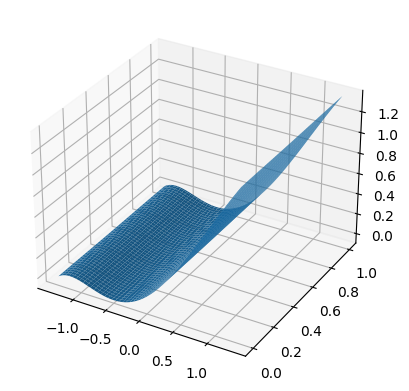


Train Epoch: 53 	Loss: 0.0091527058	Equation Loss: 0.0078892531 	 BC Loss 0.001263
Right_boundary loss 0.0002405143	Left_boundary loss 0.0000078864	Up_boundary loss 0.0010150516


Train Epoch: 53 	Loss: 0.0073756883	Equation Loss: 0.0061080009 	 BC Loss 0.001268
Right_boundary loss 0.0002408203	Left_boundary loss 0.0000128137	Up_boundary loss 0.0010140535


Train Epoch: 53 	Loss: 0.0065702721	Equation Loss: 0.0053048832 	 BC Loss 0.001265
Right_boundary loss 0.0002408707	Left_boundary loss 0.0000096705	Up_boundary loss 0.0010148479


Train Epoch: 53 	Loss: 0.0072513977	Equation Loss: 0.0059860116 	 BC Loss 0.001265
Right_boundary loss 0.0002411782	Left_boundary loss 0.0000120266	Up_boundary loss 0.0010121812



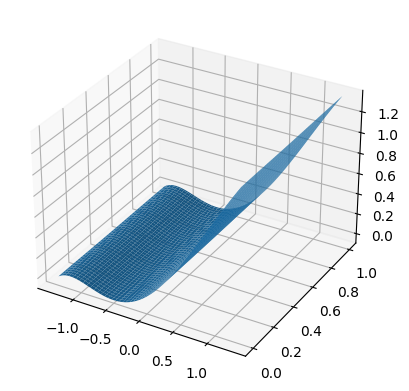


Train Epoch: 54 	Loss: 0.0095279245	Equation Loss: 0.0082657738 	 BC Loss 0.001262
Right_boundary loss 0.0002413421	Left_boundary loss 0.0000098254	Up_boundary loss 0.0010109835


Train Epoch: 54 	Loss: 0.0083124973	Equation Loss: 0.0070490427 	 BC Loss 0.001263
Right_boundary loss 0.0002415818	Left_boundary loss 0.0000146583	Up_boundary loss 0.0010072141


Train Epoch: 54 	Loss: 0.0084822280	Equation Loss: 0.0072205719 	 BC Loss 0.001262
Right_boundary loss 0.0002411894	Left_boundary loss 0.0000108620	Up_boundary loss 0.0010096052


Train Epoch: 54 	Loss: 0.0087595163	Equation Loss: 0.0074998168 	 BC Loss 0.001260
Right_boundary loss 0.0002406531	Left_boundary loss 0.0000074875	Up_boundary loss 0.0010115593



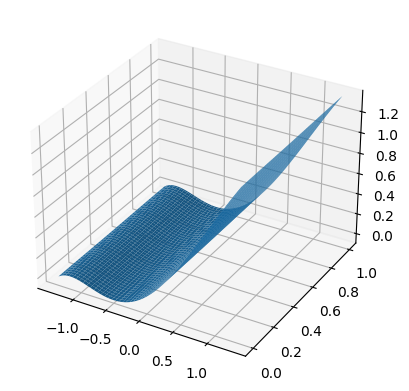


Train Epoch: 55 	Loss: 0.0065720147	Equation Loss: 0.0053116092 	 BC Loss 0.001260
Right_boundary loss 0.0002410518	Left_boundary loss 0.0000137345	Up_boundary loss 0.0010056192


Train Epoch: 55 	Loss: 0.0074659213	Equation Loss: 0.0062055262 	 BC Loss 0.001260
Right_boundary loss 0.0002407374	Left_boundary loss 0.0000081764	Up_boundary loss 0.0010114812


Train Epoch: 55 	Loss: 0.0067307241	Equation Loss: 0.0054719173 	 BC Loss 0.001259
Right_boundary loss 0.0002405741	Left_boundary loss 0.0000078177	Up_boundary loss 0.0010104149


Train Epoch: 55 	Loss: 0.0079116672	Equation Loss: 0.0066515617 	 BC Loss 0.001260
Right_boundary loss 0.0002408248	Left_boundary loss 0.0000149537	Up_boundary loss 0.0010043265



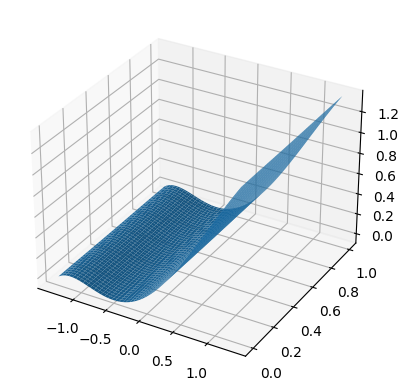


Train Epoch: 56 	Loss: 0.0068702549	Equation Loss: 0.0056131836 	 BC Loss 0.001257
Right_boundary loss 0.0002406102	Left_boundary loss 0.0000110443	Up_boundary loss 0.0010054169


Train Epoch: 56 	Loss: 0.0079305535	Equation Loss: 0.0066745188 	 BC Loss 0.001256
Right_boundary loss 0.0002402124	Left_boundary loss 0.0000080820	Up_boundary loss 0.0010077404


Train Epoch: 56 	Loss: 0.0051943399	Equation Loss: 0.0039352588 	 BC Loss 0.001259
Right_boundary loss 0.0002398949	Left_boundary loss 0.0000065253	Up_boundary loss 0.0010126611


Train Epoch: 56 	Loss: 0.0081743477	Equation Loss: 0.0069187698 	 BC Loss 0.001256
Right_boundary loss 0.0002400553	Left_boundary loss 0.0000078076	Up_boundary loss 0.0010077147



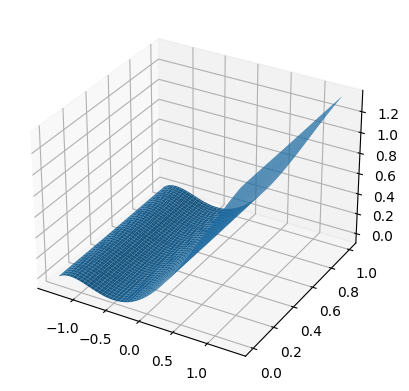


Train Epoch: 57 	Loss: 0.0068311882	Equation Loss: 0.0055751088 	 BC Loss 0.001256
Right_boundary loss 0.0002400553	Left_boundary loss 0.0000118501	Up_boundary loss 0.0010041739


Train Epoch: 57 	Loss: 0.0072300350	Equation Loss: 0.0059740287 	 BC Loss 0.001256
Right_boundary loss 0.0002394338	Left_boundary loss 0.0000066842	Up_boundary loss 0.0010098881


Train Epoch: 57 	Loss: 0.0083919391	Equation Loss: 0.0071365866 	 BC Loss 0.001255
Right_boundary loss 0.0002394294	Left_boundary loss 0.0000098442	Up_boundary loss 0.0010060791


Train Epoch: 57 	Loss: 0.0068847267	Equation Loss: 0.0056291893 	 BC Loss 0.001256
Right_boundary loss 0.0002391224	Left_boundary loss 0.0000068331	Up_boundary loss 0.0010095818



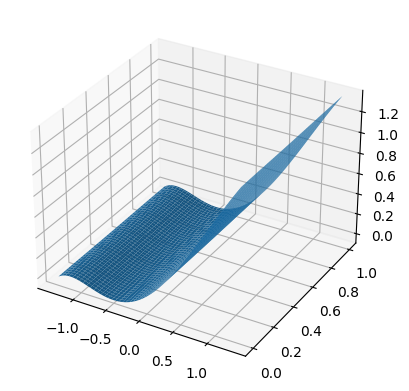


Train Epoch: 58 	Loss: 0.0080947923	Equation Loss: 0.0068399762 	 BC Loss 0.001255
Right_boundary loss 0.0002395568	Left_boundary loss 0.0000147004	Up_boundary loss 0.0010005586


Train Epoch: 58 	Loss: 0.0077450019	Equation Loss: 0.0064934315 	 BC Loss 0.001252
Right_boundary loss 0.0002391586	Left_boundary loss 0.0000075831	Up_boundary loss 0.0010048286


Train Epoch: 58 	Loss: 0.0088031758	Equation Loss: 0.0075510209 	 BC Loss 0.001252
Right_boundary loss 0.0002388917	Left_boundary loss 0.0000102232	Up_boundary loss 0.0010030398


Train Epoch: 58 	Loss: 0.0071080057	Equation Loss: 0.0058536702 	 BC Loss 0.001254
Right_boundary loss 0.0002383960	Left_boundary loss 0.0000085491	Up_boundary loss 0.0010073906



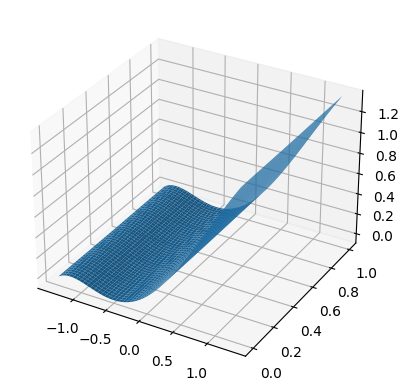


Train Epoch: 59 	Loss: 0.0091721071	Equation Loss: 0.0079199243 	 BC Loss 0.001252
Right_boundary loss 0.0002388433	Left_boundary loss 0.0000102251	Up_boundary loss 0.0010031146


Train Epoch: 59 	Loss: 0.0062636342	Equation Loss: 0.0050146417 	 BC Loss 0.001249
Right_boundary loss 0.0002389214	Left_boundary loss 0.0000071446	Up_boundary loss 0.0010029265


Train Epoch: 59 	Loss: 0.0087924916	Equation Loss: 0.0075432318 	 BC Loss 0.001249
Right_boundary loss 0.0002389040	Left_boundary loss 0.0000112154	Up_boundary loss 0.0009991403


Train Epoch: 59 	Loss: 0.0072095217	Equation Loss: 0.0059605362 	 BC Loss 0.001249
Right_boundary loss 0.0002386200	Left_boundary loss 0.0000107375	Up_boundary loss 0.0009996278



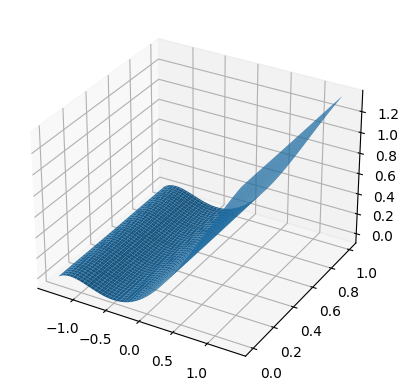


Train Epoch: 60 	Loss: 0.0066665756	Equation Loss: 0.0054182759 	 BC Loss 0.001248
Right_boundary loss 0.0002382241	Left_boundary loss 0.0000084046	Up_boundary loss 0.0010016708


Train Epoch: 60 	Loss: 0.0089502763	Equation Loss: 0.0077052708 	 BC Loss 0.001245
Right_boundary loss 0.0002382828	Left_boundary loss 0.0000097669	Up_boundary loss 0.0009969559


Train Epoch: 60 	Loss: 0.0084669059	Equation Loss: 0.0072160959 	 BC Loss 0.001251
Right_boundary loss 0.0002382341	Left_boundary loss 0.0000151360	Up_boundary loss 0.0009974400


Train Epoch: 60 	Loss: 0.0056871916	Equation Loss: 0.0044368249 	 BC Loss 0.001250
Right_boundary loss 0.0002380041	Left_boundary loss 0.0000126958	Up_boundary loss 0.0009996666



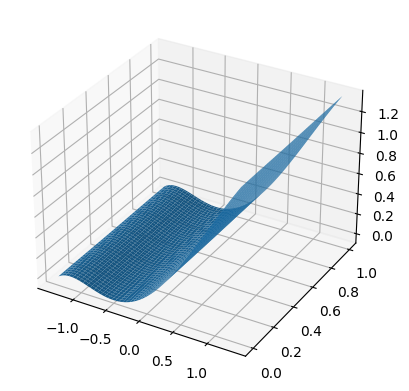


Train Epoch: 61 	Loss: 0.0083335089	Equation Loss: 0.0070854095 	 BC Loss 0.001248
Right_boundary loss 0.0002375788	Left_boundary loss 0.0000072771	Up_boundary loss 0.0010032437


Train Epoch: 61 	Loss: 0.0075397105	Equation Loss: 0.0062918295 	 BC Loss 0.001248
Right_boundary loss 0.0002376391	Left_boundary loss 0.0000098646	Up_boundary loss 0.0010003773


Train Epoch: 61 	Loss: 0.0068472992	Equation Loss: 0.0056007807 	 BC Loss 0.001247
Right_boundary loss 0.0002373757	Left_boundary loss 0.0000078969	Up_boundary loss 0.0010012458


Train Epoch: 61 	Loss: 0.0060645407	Equation Loss: 0.0048158057 	 BC Loss 0.001249
Right_boundary loss 0.0002374245	Left_boundary loss 0.0000104616	Up_boundary loss 0.0010008491



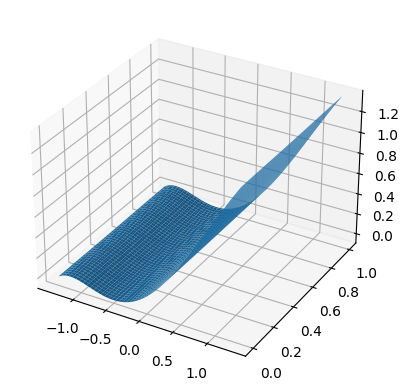


Train Epoch: 62 	Loss: 0.0066854749	Equation Loss: 0.0054372936 	 BC Loss 0.001248
Right_boundary loss 0.0002375278	Left_boundary loss 0.0000125188	Up_boundary loss 0.0009981350


Train Epoch: 62 	Loss: 0.0062477775	Equation Loss: 0.0050019822 	 BC Loss 0.001246
Right_boundary loss 0.0002374117	Left_boundary loss 0.0000111936	Up_boundary loss 0.0009971898


Train Epoch: 62 	Loss: 0.0078049162	Equation Loss: 0.0065627336 	 BC Loss 0.001242
Right_boundary loss 0.0002371245	Left_boundary loss 0.0000069699	Up_boundary loss 0.0009980882


Train Epoch: 62 	Loss: 0.0064696856	Equation Loss: 0.0052261720 	 BC Loss 0.001244
Right_boundary loss 0.0002369282	Left_boundary loss 0.0000078434	Up_boundary loss 0.0009987417



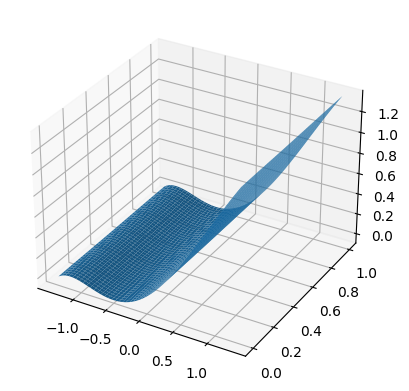


Train Epoch: 63 	Loss: 0.0072200084	Equation Loss: 0.0059746667 	 BC Loss 0.001245
Right_boundary loss 0.0002368580	Left_boundary loss 0.0000091474	Up_boundary loss 0.0009993361


Train Epoch: 63 	Loss: 0.0071722721	Equation Loss: 0.0059261620 	 BC Loss 0.001246
Right_boundary loss 0.0002366996	Left_boundary loss 0.0000078137	Up_boundary loss 0.0010015969


Train Epoch: 63 	Loss: 0.0076407567	Equation Loss: 0.0063956864 	 BC Loss 0.001245
Right_boundary loss 0.0002368145	Left_boundary loss 0.0000108674	Up_boundary loss 0.0009973883


Train Epoch: 63 	Loss: 0.0066035008	Equation Loss: 0.0053513655 	 BC Loss 0.001252
Right_boundary loss 0.0002371238	Left_boundary loss 0.0000208179	Up_boundary loss 0.0009941938



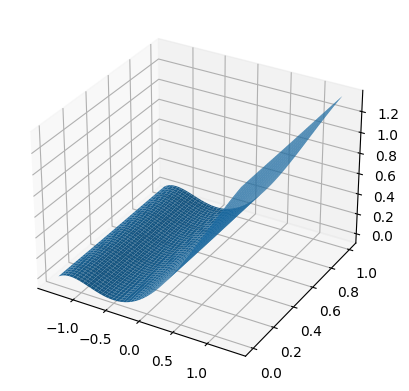


Train Epoch: 64 	Loss: 0.0066554691	Equation Loss: 0.0054121325 	 BC Loss 0.001243
Right_boundary loss 0.0002368138	Left_boundary loss 0.0000068146	Up_boundary loss 0.0009997081


Train Epoch: 64 	Loss: 0.0077281590	Equation Loss: 0.0064849947 	 BC Loss 0.001243
Right_boundary loss 0.0002368096	Left_boundary loss 0.0000086379	Up_boundary loss 0.0009977169


Train Epoch: 64 	Loss: 0.0081746466	Equation Loss: 0.0069280704 	 BC Loss 0.001247
Right_boundary loss 0.0002366632	Left_boundary loss 0.0000132274	Up_boundary loss 0.0009966861


Train Epoch: 64 	Loss: 0.0087421220	Equation Loss: 0.0074997204 	 BC Loss 0.001242
Right_boundary loss 0.0002365339	Left_boundary loss 0.0000073928	Up_boundary loss 0.0009984747



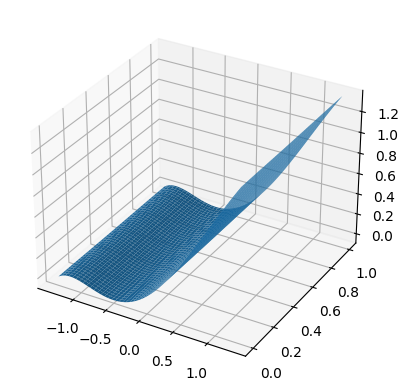


Train Epoch: 65 	Loss: 0.0083109150	Equation Loss: 0.0070682047 	 BC Loss 0.001243
Right_boundary loss 0.0002366059	Left_boundary loss 0.0000098290	Up_boundary loss 0.0009962752


Train Epoch: 65 	Loss: 0.0066695306	Equation Loss: 0.0054283310 	 BC Loss 0.001241
Right_boundary loss 0.0002362920	Left_boundary loss 0.0000067913	Up_boundary loss 0.0009981163


Train Epoch: 65 	Loss: 0.0062299259	Equation Loss: 0.0049873749 	 BC Loss 0.001243
Right_boundary loss 0.0002358798	Left_boundary loss 0.0000065744	Up_boundary loss 0.0010000968


Train Epoch: 65 	Loss: 0.0082982350	Equation Loss: 0.0070562023 	 BC Loss 0.001242
Right_boundary loss 0.0002358557	Left_boundary loss 0.0000074223	Up_boundary loss 0.0009987548



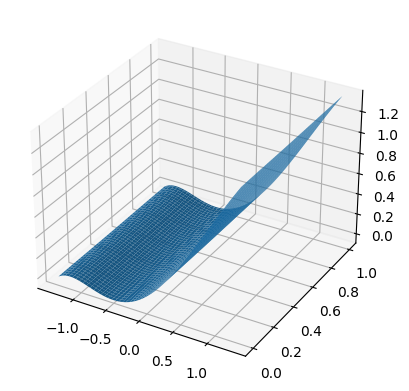


Train Epoch: 66 	Loss: 0.0063304887	Equation Loss: 0.0050914641 	 BC Loss 0.001239
Right_boundary loss 0.0002361155	Left_boundary loss 0.0000093885	Up_boundary loss 0.0009935206


Train Epoch: 66 	Loss: 0.0060768463	Equation Loss: 0.0048390739 	 BC Loss 0.001238
Right_boundary loss 0.0002359837	Left_boundary loss 0.0000072227	Up_boundary loss 0.0009945659


Train Epoch: 66 	Loss: 0.0073089385	Equation Loss: 0.0060711191 	 BC Loss 0.001238
Right_boundary loss 0.0002357237	Left_boundary loss 0.0000069676	Up_boundary loss 0.0009951282


Train Epoch: 66 	Loss: 0.0075761545	Equation Loss: 0.0063346783 	 BC Loss 0.001241
Right_boundary loss 0.0002358176	Left_boundary loss 0.0000135319	Up_boundary loss 0.0009921266



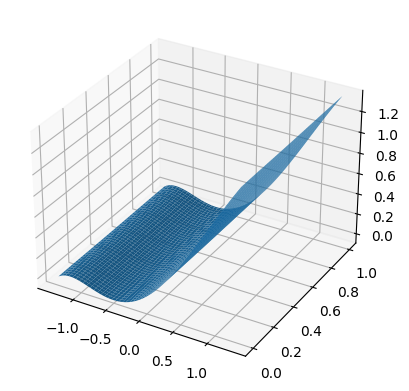


Train Epoch: 67 	Loss: 0.0077716638	Equation Loss: 0.0065336418 	 BC Loss 0.001238
Right_boundary loss 0.0002352698	Left_boundary loss 0.0000069805	Up_boundary loss 0.0009957716


Train Epoch: 67 	Loss: 0.0072138202	Equation Loss: 0.0059742541 	 BC Loss 0.001240
Right_boundary loss 0.0002351623	Left_boundary loss 0.0000092282	Up_boundary loss 0.0009951758


Train Epoch: 67 	Loss: 0.0089674722	Equation Loss: 0.0077298097 	 BC Loss 0.001238
Right_boundary loss 0.0002354207	Left_boundary loss 0.0000116685	Up_boundary loss 0.0009905738


Train Epoch: 67 	Loss: 0.0075356527	Equation Loss: 0.0062983949 	 BC Loss 0.001237
Right_boundary loss 0.0002353370	Left_boundary loss 0.0000097772	Up_boundary loss 0.0009921436



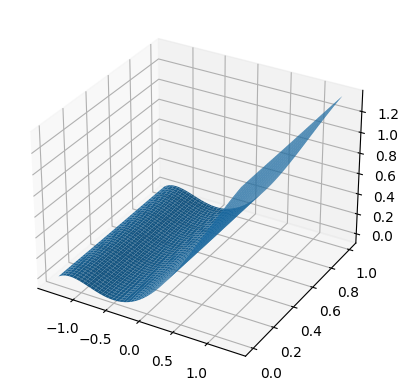


Train Epoch: 68 	Loss: 0.0073822690	Equation Loss: 0.0061450833 	 BC Loss 0.001237
Right_boundary loss 0.0002351451	Left_boundary loss 0.0000072394	Up_boundary loss 0.0009948014


Train Epoch: 68 	Loss: 0.0070505179	Equation Loss: 0.0058135712 	 BC Loss 0.001237
Right_boundary loss 0.0002351123	Left_boundary loss 0.0000087405	Up_boundary loss 0.0009930941


Train Epoch: 68 	Loss: 0.0063095470	Equation Loss: 0.0050676707 	 BC Loss 0.001242
Right_boundary loss 0.0002351807	Left_boundary loss 0.0000151258	Up_boundary loss 0.0009915698


Train Epoch: 68 	Loss: 0.0071370155	Equation Loss: 0.0058995057 	 BC Loss 0.001238
Right_boundary loss 0.0002350412	Left_boundary loss 0.0000071948	Up_boundary loss 0.0009952738



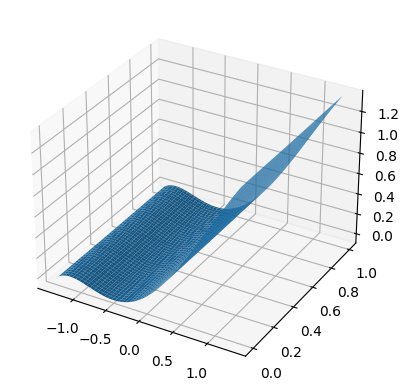


Train Epoch: 69 	Loss: 0.0069444212	Equation Loss: 0.0057061813 	 BC Loss 0.001238
Right_boundary loss 0.0002352732	Left_boundary loss 0.0000087590	Up_boundary loss 0.0009942079


Train Epoch: 69 	Loss: 0.0062405681	Equation Loss: 0.0050013424 	 BC Loss 0.001239
Right_boundary loss 0.0002353315	Left_boundary loss 0.0000093145	Up_boundary loss 0.0009945798


Train Epoch: 69 	Loss: 0.0067427191	Equation Loss: 0.0055055013 	 BC Loss 0.001237
Right_boundary loss 0.0002353665	Left_boundary loss 0.0000090763	Up_boundary loss 0.0009927748


Train Epoch: 69 	Loss: 0.0087817833	Equation Loss: 0.0075464365 	 BC Loss 0.001235
Right_boundary loss 0.0002351855	Left_boundary loss 0.0000062570	Up_boundary loss 0.0009939047



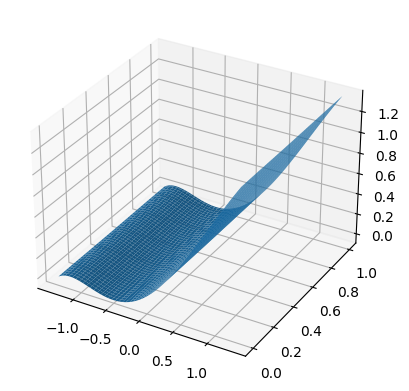


Train Epoch: 70 	Loss: 0.0077535431	Equation Loss: 0.0065185218 	 BC Loss 0.001235
Right_boundary loss 0.0002352266	Left_boundary loss 0.0000085340	Up_boundary loss 0.0009912605


Train Epoch: 70 	Loss: 0.0073079439	Equation Loss: 0.0060749124 	 BC Loss 0.001233
Right_boundary loss 0.0002349546	Left_boundary loss 0.0000057177	Up_boundary loss 0.0009923595


Train Epoch: 70 	Loss: 0.0069929166	Equation Loss: 0.0057595209 	 BC Loss 0.001233
Right_boundary loss 0.0002348857	Left_boundary loss 0.0000077198	Up_boundary loss 0.0009907903


Train Epoch: 70 	Loss: 0.0069483956	Equation Loss: 0.0057144323 	 BC Loss 0.001234
Right_boundary loss 0.0002348605	Left_boundary loss 0.0000088518	Up_boundary loss 0.0009902507



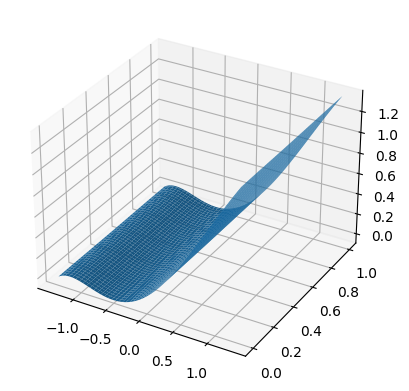


Train Epoch: 71 	Loss: 0.0073258732	Equation Loss: 0.0060903267 	 BC Loss 0.001236
Right_boundary loss 0.0002347672	Left_boundary loss 0.0000113044	Up_boundary loss 0.0009894751


Train Epoch: 71 	Loss: 0.0065161232	Equation Loss: 0.0052808970 	 BC Loss 0.001235
Right_boundary loss 0.0002348210	Left_boundary loss 0.0000111348	Up_boundary loss 0.0009892706


Train Epoch: 71 	Loss: 0.0064364006	Equation Loss: 0.0052015651 	 BC Loss 0.001235
Right_boundary loss 0.0002344687	Left_boundary loss 0.0000061897	Up_boundary loss 0.0009941771


Train Epoch: 71 	Loss: 0.0064999186	Equation Loss: 0.0052635842 	 BC Loss 0.001236
Right_boundary loss 0.0002345961	Left_boundary loss 0.0000099963	Up_boundary loss 0.0009917421



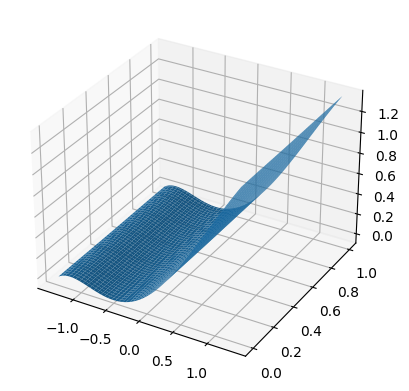


Train Epoch: 72 	Loss: 0.0072127222	Equation Loss: 0.0059766169 	 BC Loss 0.001236
Right_boundary loss 0.0002347067	Left_boundary loss 0.0000121341	Up_boundary loss 0.0009892646


Train Epoch: 72 	Loss: 0.0055680438	Equation Loss: 0.0043348465 	 BC Loss 0.001233
Right_boundary loss 0.0002343780	Left_boundary loss 0.0000061607	Up_boundary loss 0.0009926588


Train Epoch: 72 	Loss: 0.0081132734	Equation Loss: 0.0068774004 	 BC Loss 0.001236
Right_boundary loss 0.0002346986	Left_boundary loss 0.0000102255	Up_boundary loss 0.0009909490


Train Epoch: 72 	Loss: 0.0064350916	Equation Loss: 0.0051993458 	 BC Loss 0.001236
Right_boundary loss 0.0002346680	Left_boundary loss 0.0000114334	Up_boundary loss 0.0009896447



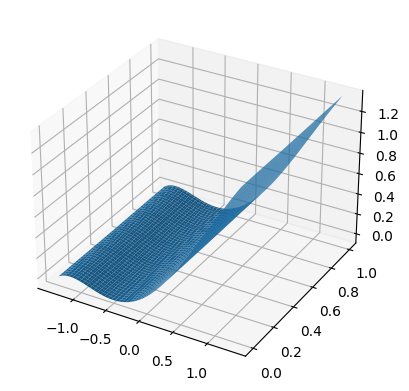


Train Epoch: 73 	Loss: 0.0071913665	Equation Loss: 0.0059585930 	 BC Loss 0.001233
Right_boundary loss 0.0002343719	Left_boundary loss 0.0000075025	Up_boundary loss 0.0009908989


Train Epoch: 73 	Loss: 0.0077302163	Equation Loss: 0.0064975233 	 BC Loss 0.001233
Right_boundary loss 0.0002343753	Left_boundary loss 0.0000080046	Up_boundary loss 0.0009903130


Train Epoch: 73 	Loss: 0.0059016696	Equation Loss: 0.0046643089 	 BC Loss 0.001237
Right_boundary loss 0.0002344165	Left_boundary loss 0.0000150185	Up_boundary loss 0.0009879257


Train Epoch: 73 	Loss: 0.0079862662	Equation Loss: 0.0067527969 	 BC Loss 0.001233
Right_boundary loss 0.0002341505	Left_boundary loss 0.0000100720	Up_boundary loss 0.0009892462



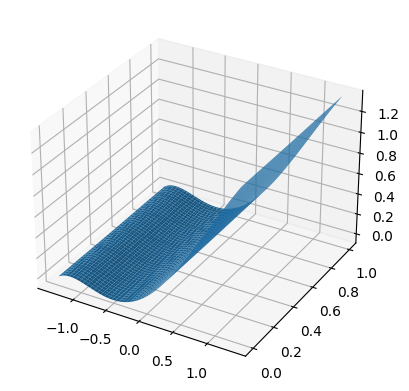


Train Epoch: 74 	Loss: 0.0072921892	Equation Loss: 0.0060604773 	 BC Loss 0.001232
Right_boundary loss 0.0002339064	Left_boundary loss 0.0000064244	Up_boundary loss 0.0009913811


Train Epoch: 74 	Loss: 0.0078707002	Equation Loss: 0.0066418704 	 BC Loss 0.001229
Right_boundary loss 0.0002337978	Left_boundary loss 0.0000074025	Up_boundary loss 0.0009876298


Train Epoch: 74 	Loss: 0.0061116014	Equation Loss: 0.0048816800 	 BC Loss 0.001230
Right_boundary loss 0.0002336960	Left_boundary loss 0.0000088190	Up_boundary loss 0.0009874064


Train Epoch: 74 	Loss: 0.0084445719	Equation Loss: 0.0072115641 	 BC Loss 0.001233
Right_boundary loss 0.0002336720	Left_boundary loss 0.0000137795	Up_boundary loss 0.0009855558



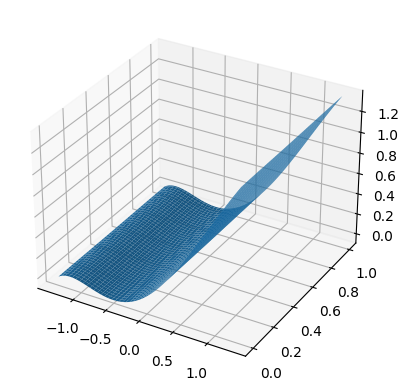


Train Epoch: 75 	Loss: 0.0054986859	Equation Loss: 0.0042644362 	 BC Loss 0.001234
Right_boundary loss 0.0002334650	Left_boundary loss 0.0000130924	Up_boundary loss 0.0009876922


Train Epoch: 75 	Loss: 0.0070031313	Equation Loss: 0.0057694465 	 BC Loss 0.001234
Right_boundary loss 0.0002333199	Left_boundary loss 0.0000115984	Up_boundary loss 0.0009887667


Train Epoch: 75 	Loss: 0.0081671923	Equation Loss: 0.0069361259 	 BC Loss 0.001231
Right_boundary loss 0.0002332468	Left_boundary loss 0.0000076424	Up_boundary loss 0.0009901776


Train Epoch: 75 	Loss: 0.0067822095	Equation Loss: 0.0055505191 	 BC Loss 0.001232
Right_boundary loss 0.0002330148	Left_boundary loss 0.0000067358	Up_boundary loss 0.0009919396



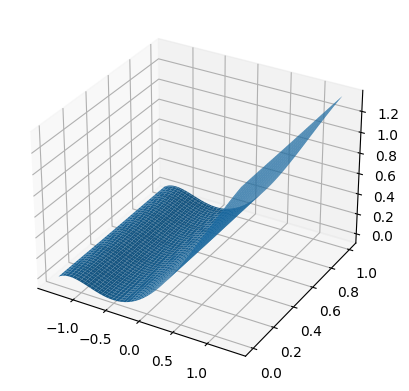


Train Epoch: 76 	Loss: 0.0067298464	Equation Loss: 0.0054987106 	 BC Loss 0.001231
Right_boundary loss 0.0002332853	Left_boundary loss 0.0000117180	Up_boundary loss 0.0009861324


Train Epoch: 76 	Loss: 0.0063277134	Equation Loss: 0.0050963238 	 BC Loss 0.001231
Right_boundary loss 0.0002330333	Left_boundary loss 0.0000123713	Up_boundary loss 0.0009859848


Train Epoch: 76 	Loss: 0.0066844756	Equation Loss: 0.0054527670 	 BC Loss 0.001232
Right_boundary loss 0.0002325232	Left_boundary loss 0.0000057894	Up_boundary loss 0.0009933958


Train Epoch: 76 	Loss: 0.0058437823	Equation Loss: 0.0046149986 	 BC Loss 0.001229
Right_boundary loss 0.0002326559	Left_boundary loss 0.0000070955	Up_boundary loss 0.0009890322



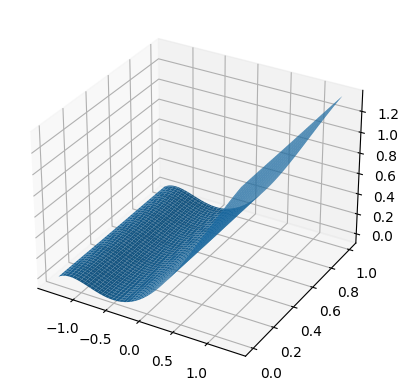


Train Epoch: 77 	Loss: 0.0075178761	Equation Loss: 0.0062863817 	 BC Loss 0.001231
Right_boundary loss 0.0002327152	Left_boundary loss 0.0000135306	Up_boundary loss 0.0009852485


Train Epoch: 77 	Loss: 0.0075584329	Equation Loss: 0.0063299611 	 BC Loss 0.001228
Right_boundary loss 0.0002324537	Left_boundary loss 0.0000077752	Up_boundary loss 0.0009882429


Train Epoch: 77 	Loss: 0.0055205412	Equation Loss: 0.0042918087 	 BC Loss 0.001229
Right_boundary loss 0.0002325403	Left_boundary loss 0.0000100996	Up_boundary loss 0.0009860927


Train Epoch: 77 	Loss: 0.0074378084	Equation Loss: 0.0062080091 	 BC Loss 0.001230
Right_boundary loss 0.0002323640	Left_boundary loss 0.0000110622	Up_boundary loss 0.0009863732



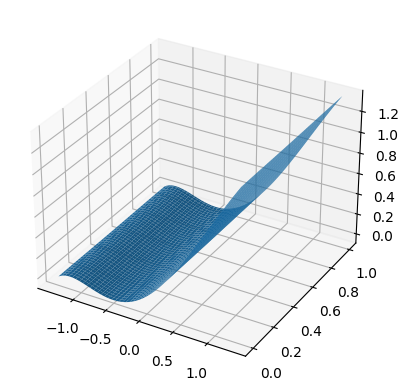


Train Epoch: 78 	Loss: 0.0078742867	Equation Loss: 0.0066462262 	 BC Loss 0.001228
Right_boundary loss 0.0002319998	Left_boundary loss 0.0000059542	Up_boundary loss 0.0009901064


Train Epoch: 78 	Loss: 0.0075435219	Equation Loss: 0.0063163713 	 BC Loss 0.001227
Right_boundary loss 0.0002320981	Left_boundary loss 0.0000064327	Up_boundary loss 0.0009886198


Train Epoch: 78 	Loss: 0.0073509561	Equation Loss: 0.0061214790 	 BC Loss 0.001229
Right_boundary loss 0.0002320069	Left_boundary loss 0.0000094312	Up_boundary loss 0.0009880387


Train Epoch: 78 	Loss: 0.0072303517	Equation Loss: 0.0060032308 	 BC Loss 0.001227
Right_boundary loss 0.0002319412	Left_boundary loss 0.0000086180	Up_boundary loss 0.0009865616



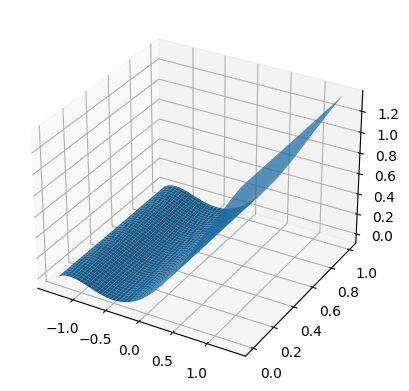


Train Epoch: 79 	Loss: 0.0065169721	Equation Loss: 0.0052896091 	 BC Loss 0.001227
Right_boundary loss 0.0002316346	Left_boundary loss 0.0000058622	Up_boundary loss 0.0009898662


Train Epoch: 79 	Loss: 0.0080448668	Equation Loss: 0.0068231463 	 BC Loss 0.001222
Right_boundary loss 0.0002321699	Left_boundary loss 0.0000091193	Up_boundary loss 0.0009804313


Train Epoch: 79 	Loss: 0.0081928680	Equation Loss: 0.0069711884 	 BC Loss 0.001222
Right_boundary loss 0.0002319088	Left_boundary loss 0.0000085370	Up_boundary loss 0.0009812339


Train Epoch: 79 	Loss: 0.0077489801	Equation Loss: 0.0065231528 	 BC Loss 0.001226
Right_boundary loss 0.0002316120	Left_boundary loss 0.0000108900	Up_boundary loss 0.0009833254



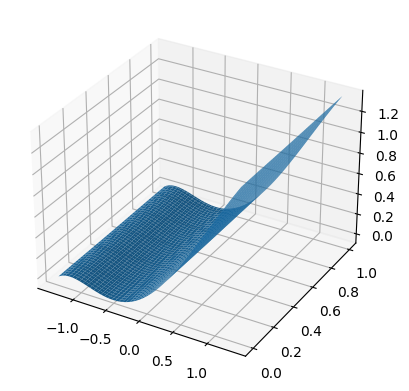


Train Epoch: 80 	Loss: 0.0101181697	Equation Loss: 0.0088913711 	 BC Loss 0.001227
Right_boundary loss 0.0002311619	Left_boundary loss 0.0000060056	Up_boundary loss 0.0009896313


Train Epoch: 80 	Loss: 0.0070540323	Equation Loss: 0.0058184974 	 BC Loss 0.001236
Right_boundary loss 0.0002313894	Left_boundary loss 0.0000168460	Up_boundary loss 0.0009872996


Train Epoch: 80 	Loss: 0.0058831698	Equation Loss: 0.0046537700 	 BC Loss 0.001229
Right_boundary loss 0.0002309800	Left_boundary loss 0.0000066466	Up_boundary loss 0.0009917732


Train Epoch: 80 	Loss: 0.0067981421	Equation Loss: 0.0055701402 	 BC Loss 0.001228
Right_boundary loss 0.0002312974	Left_boundary loss 0.0000068151	Up_boundary loss 0.0009898895



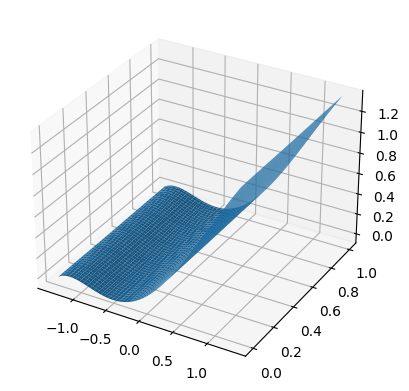


Train Epoch: 81 	Loss: 0.0061176843	Equation Loss: 0.0048884340 	 BC Loss 0.001229
Right_boundary loss 0.0002316980	Left_boundary loss 0.0000132017	Up_boundary loss 0.0009843507


Train Epoch: 81 	Loss: 0.0078533627	Equation Loss: 0.0066293329 	 BC Loss 0.001224
Right_boundary loss 0.0002315596	Left_boundary loss 0.0000072759	Up_boundary loss 0.0009851941


Train Epoch: 81 	Loss: 0.0078540575	Equation Loss: 0.0066287476 	 BC Loss 0.001225
Right_boundary loss 0.0002312916	Left_boundary loss 0.0000064883	Up_boundary loss 0.0009875299


Train Epoch: 81 	Loss: 0.0080270637	Equation Loss: 0.0067999358 	 BC Loss 0.001227
Right_boundary loss 0.0002310888	Left_boundary loss 0.0000059323	Up_boundary loss 0.0009901065



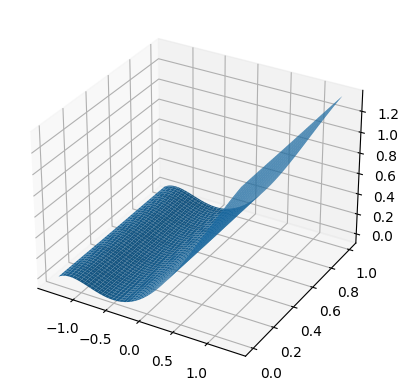


Train Epoch: 82 	Loss: 0.0072540995	Equation Loss: 0.0060278517 	 BC Loss 0.001226
Right_boundary loss 0.0002314893	Left_boundary loss 0.0000099340	Up_boundary loss 0.0009848246


Train Epoch: 82 	Loss: 0.0075392798	Equation Loss: 0.0063109430 	 BC Loss 0.001228
Right_boundary loss 0.0002314557	Left_boundary loss 0.0000095650	Up_boundary loss 0.0009873158


Train Epoch: 82 	Loss: 0.0094148191	Equation Loss: 0.0081875036 	 BC Loss 0.001227
Right_boundary loss 0.0002313495	Left_boundary loss 0.0000073977	Up_boundary loss 0.0009885683


Train Epoch: 82 	Loss: 0.0057823057	Equation Loss: 0.0045559104 	 BC Loss 0.001226
Right_boundary loss 0.0002316314	Left_boundary loss 0.0000117393	Up_boundary loss 0.0009830247



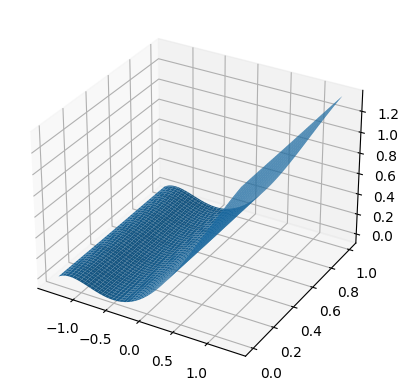


Train Epoch: 83 	Loss: 0.0076345964	Equation Loss: 0.0064116758 	 BC Loss 0.001223
Right_boundary loss 0.0002311433	Left_boundary loss 0.0000053311	Up_boundary loss 0.0009864462


Train Epoch: 83 	Loss: 0.0060758395	Equation Loss: 0.0048517920 	 BC Loss 0.001224
Right_boundary loss 0.0002309532	Left_boundary loss 0.0000075500	Up_boundary loss 0.0009855445


Train Epoch: 83 	Loss: 0.0082314471	Equation Loss: 0.0070064366 	 BC Loss 0.001225
Right_boundary loss 0.0002307325	Left_boundary loss 0.0000076331	Up_boundary loss 0.0009866448


Train Epoch: 83 	Loss: 0.0077756802	Equation Loss: 0.0065532727 	 BC Loss 0.001222
Right_boundary loss 0.0002310619	Left_boundary loss 0.0000093262	Up_boundary loss 0.0009820196



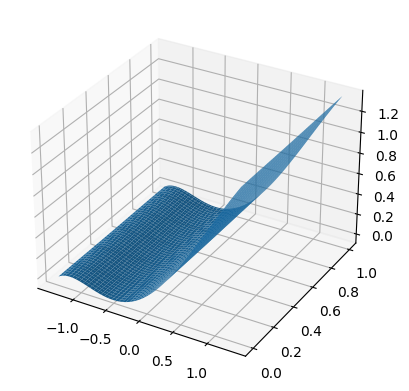


Train Epoch: 84 	Loss: 0.0062468443	Equation Loss: 0.0050258851 	 BC Loss 0.001221
Right_boundary loss 0.0002308038	Left_boundary loss 0.0000054137	Up_boundary loss 0.0009847417


Train Epoch: 84 	Loss: 0.0067673894	Equation Loss: 0.0055471119 	 BC Loss 0.001220
Right_boundary loss 0.0002307134	Left_boundary loss 0.0000056787	Up_boundary loss 0.0009838854


Train Epoch: 84 	Loss: 0.0058866148	Equation Loss: 0.0046668909 	 BC Loss 0.001220
Right_boundary loss 0.0002304682	Left_boundary loss 0.0000069420	Up_boundary loss 0.0009823136


Train Epoch: 84 	Loss: 0.0071916673	Equation Loss: 0.0059727267 	 BC Loss 0.001219
Right_boundary loss 0.0002303012	Left_boundary loss 0.0000089845	Up_boundary loss 0.0009796548



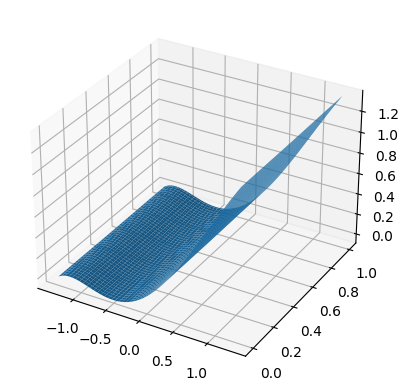


Train Epoch: 85 	Loss: 0.0075278748	Equation Loss: 0.0063074483 	 BC Loss 0.001220
Right_boundary loss 0.0002298399	Left_boundary loss 0.0000055344	Up_boundary loss 0.0009850522


Train Epoch: 85 	Loss: 0.0072560664	Equation Loss: 0.0060335668 	 BC Loss 0.001222
Right_boundary loss 0.0002297329	Left_boundary loss 0.0000074041	Up_boundary loss 0.0009853626


Train Epoch: 85 	Loss: 0.0069654896	Equation Loss: 0.0057454775 	 BC Loss 0.001220
Right_boundary loss 0.0002298130	Left_boundary loss 0.0000074925	Up_boundary loss 0.0009827064


Train Epoch: 85 	Loss: 0.0080182441	Equation Loss: 0.0067993663 	 BC Loss 0.001219
Right_boundary loss 0.0002297955	Left_boundary loss 0.0000071569	Up_boundary loss 0.0009819258



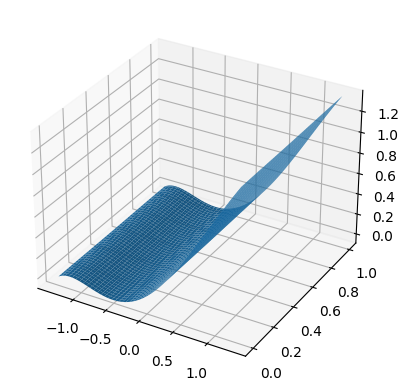


Train Epoch: 86 	Loss: 0.0079302080	Equation Loss: 0.0067085796 	 BC Loss 0.001222
Right_boundary loss 0.0002296080	Left_boundary loss 0.0000056960	Up_boundary loss 0.0009863243


Train Epoch: 86 	Loss: 0.0074535776	Equation Loss: 0.0062318631 	 BC Loss 0.001222
Right_boundary loss 0.0002297167	Left_boundary loss 0.0000064410	Up_boundary loss 0.0009855569


Train Epoch: 86 	Loss: 0.0070729624	Equation Loss: 0.0058522150 	 BC Loss 0.001221
Right_boundary loss 0.0002298243	Left_boundary loss 0.0000068993	Up_boundary loss 0.0009840238


Train Epoch: 86 	Loss: 0.0067015872	Equation Loss: 0.0054797414 	 BC Loss 0.001222
Right_boundary loss 0.0002298663	Left_boundary loss 0.0000107514	Up_boundary loss 0.0009812283



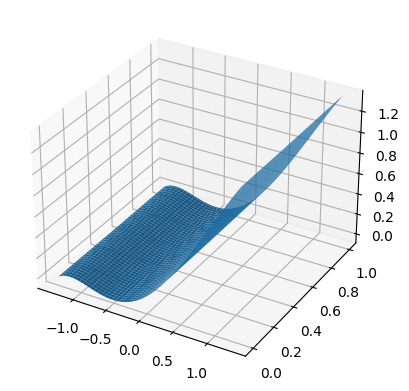


Train Epoch: 87 	Loss: 0.0061727744	Equation Loss: 0.0049526393 	 BC Loss 0.001220
Right_boundary loss 0.0002296685	Left_boundary loss 0.0000076461	Up_boundary loss 0.0009828203


Train Epoch: 87 	Loss: 0.0071244370	Equation Loss: 0.0059053223 	 BC Loss 0.001219
Right_boundary loss 0.0002293590	Left_boundary loss 0.0000076988	Up_boundary loss 0.0009820572


Train Epoch: 87 	Loss: 0.0059754234	Equation Loss: 0.0047524502 	 BC Loss 0.001223
Right_boundary loss 0.0002294385	Left_boundary loss 0.0000106288	Up_boundary loss 0.0009829060


Train Epoch: 87 	Loss: 0.0073663439	Equation Loss: 0.0061476692 	 BC Loss 0.001219
Right_boundary loss 0.0002296554	Left_boundary loss 0.0000084526	Up_boundary loss 0.0009805667



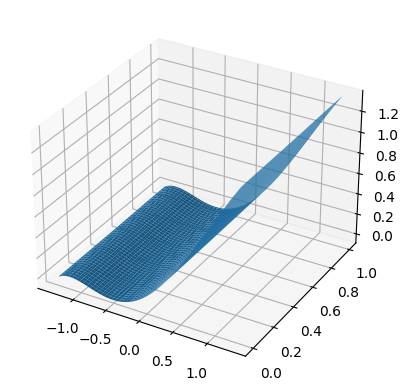


Train Epoch: 88 	Loss: 0.0063093752	Equation Loss: 0.0050869947 	 BC Loss 0.001222
Right_boundary loss 0.0002296536	Left_boundary loss 0.0000138246	Up_boundary loss 0.0009789022


Train Epoch: 88 	Loss: 0.0071251099	Equation Loss: 0.0059060911 	 BC Loss 0.001219
Right_boundary loss 0.0002291692	Left_boundary loss 0.0000060297	Up_boundary loss 0.0009838199


Train Epoch: 88 	Loss: 0.0057104458	Equation Loss: 0.0044904249 	 BC Loss 0.001220
Right_boundary loss 0.0002290622	Left_boundary loss 0.0000059723	Up_boundary loss 0.0009849862


Train Epoch: 88 	Loss: 0.0061297612	Equation Loss: 0.0049098209 	 BC Loss 0.001220
Right_boundary loss 0.0002291061	Left_boundary loss 0.0000087377	Up_boundary loss 0.0009820963



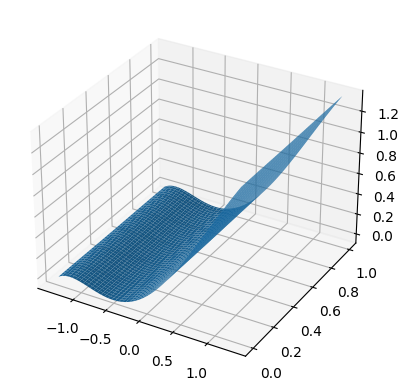


Train Epoch: 89 	Loss: 0.0064609917	Equation Loss: 0.0052401237 	 BC Loss 0.001221
Right_boundary loss 0.0002293093	Left_boundary loss 0.0000124602	Up_boundary loss 0.0009790987


Train Epoch: 89 	Loss: 0.0081703346	Equation Loss: 0.0069503235 	 BC Loss 0.001220
Right_boundary loss 0.0002290832	Left_boundary loss 0.0000123654	Up_boundary loss 0.0009785620


Train Epoch: 89 	Loss: 0.0063171620	Equation Loss: 0.0050980588 	 BC Loss 0.001219
Right_boundary loss 0.0002288964	Left_boundary loss 0.0000101503	Up_boundary loss 0.0009800564


Train Epoch: 89 	Loss: 0.0080508599	Equation Loss: 0.0068327440 	 BC Loss 0.001218
Right_boundary loss 0.0002287770	Left_boundary loss 0.0000069405	Up_boundary loss 0.0009823983



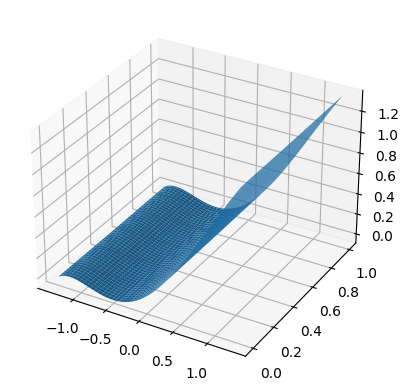


Train Epoch: 90 	Loss: 0.0084098186	Equation Loss: 0.0071917023 	 BC Loss 0.001218
Right_boundary loss 0.0002287868	Left_boundary loss 0.0000085399	Up_boundary loss 0.0009807898


Train Epoch: 90 	Loss: 0.0064809304	Equation Loss: 0.0052642827 	 BC Loss 0.001217
Right_boundary loss 0.0002285355	Left_boundary loss 0.0000060629	Up_boundary loss 0.0009820492


Train Epoch: 90 	Loss: 0.0062068524	Equation Loss: 0.0049909810 	 BC Loss 0.001216
Right_boundary loss 0.0002285649	Left_boundary loss 0.0000073555	Up_boundary loss 0.0009799511


Train Epoch: 90 	Loss: 0.0079318704	Equation Loss: 0.0067161387 	 BC Loss 0.001216
Right_boundary loss 0.0002283767	Left_boundary loss 0.0000097745	Up_boundary loss 0.0009775809



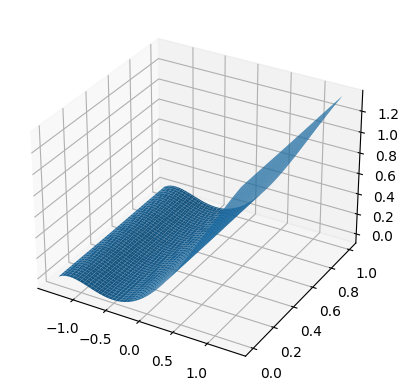


Train Epoch: 91 	Loss: 0.0067465622	Equation Loss: 0.0055301301 	 BC Loss 0.001216
Right_boundary loss 0.0002280194	Left_boundary loss 0.0000081316	Up_boundary loss 0.0009802813


Train Epoch: 91 	Loss: 0.0071400893	Equation Loss: 0.0059227282 	 BC Loss 0.001217
Right_boundary loss 0.0002279431	Left_boundary loss 0.0000091576	Up_boundary loss 0.0009802605


Train Epoch: 91 	Loss: 0.0061360113	Equation Loss: 0.0049182223 	 BC Loss 0.001218
Right_boundary loss 0.0002280139	Left_boundary loss 0.0000080757	Up_boundary loss 0.0009816996


Train Epoch: 91 	Loss: 0.0067335414	Equation Loss: 0.0055176802 	 BC Loss 0.001216
Right_boundary loss 0.0002280496	Left_boundary loss 0.0000063619	Up_boundary loss 0.0009814496



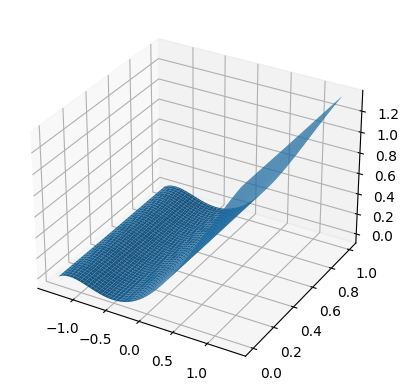


Train Epoch: 92 	Loss: 0.0065360917	Equation Loss: 0.0053200126 	 BC Loss 0.001216
Right_boundary loss 0.0002276428	Left_boundary loss 0.0000057690	Up_boundary loss 0.0009826671


Train Epoch: 92 	Loss: 0.0055946573	Equation Loss: 0.0043800296 	 BC Loss 0.001215
Right_boundary loss 0.0002277928	Left_boundary loss 0.0000085146	Up_boundary loss 0.0009783201


Train Epoch: 92 	Loss: 0.0066223657	Equation Loss: 0.0054076267 	 BC Loss 0.001215
Right_boundary loss 0.0002278561	Left_boundary loss 0.0000134972	Up_boundary loss 0.0009733858


Train Epoch: 92 	Loss: 0.0085486192	Equation Loss: 0.0073354994 	 BC Loss 0.001213
Right_boundary loss 0.0002272631	Left_boundary loss 0.0000077673	Up_boundary loss 0.0009780891



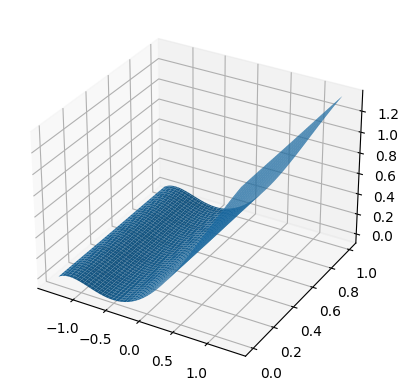


Train Epoch: 93 	Loss: 0.0066149114	Equation Loss: 0.0054003638 	 BC Loss 0.001215
Right_boundary loss 0.0002270815	Left_boundary loss 0.0000075545	Up_boundary loss 0.0009799114


Train Epoch: 93 	Loss: 0.0047232104	Equation Loss: 0.0035084966 	 BC Loss 0.001215
Right_boundary loss 0.0002270404	Left_boundary loss 0.0000077642	Up_boundary loss 0.0009799093


Train Epoch: 93 	Loss: 0.0062183333	Equation Loss: 0.0050069955 	 BC Loss 0.001211
Right_boundary loss 0.0002270773	Left_boundary loss 0.0000054094	Up_boundary loss 0.0009788510


Train Epoch: 93 	Loss: 0.0078103580	Equation Loss: 0.0065957913 	 BC Loss 0.001215
Right_boundary loss 0.0002266647	Left_boundary loss 0.0000055952	Up_boundary loss 0.0009823068



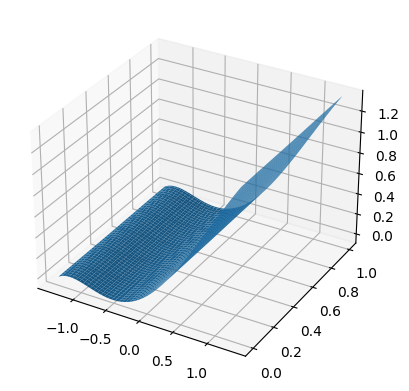


Train Epoch: 94 	Loss: 0.0074425917	Equation Loss: 0.0062261643 	 BC Loss 0.001216
Right_boundary loss 0.0002269420	Left_boundary loss 0.0000106313	Up_boundary loss 0.0009788541


Train Epoch: 94 	Loss: 0.0063558375	Equation Loss: 0.0051367930 	 BC Loss 0.001219
Right_boundary loss 0.0002269141	Left_boundary loss 0.0000105000	Up_boundary loss 0.0009816302


Train Epoch: 94 	Loss: 0.0061031086	Equation Loss: 0.0048835222 	 BC Loss 0.001220
Right_boundary loss 0.0002270304	Left_boundary loss 0.0000098089	Up_boundary loss 0.0009827469


Train Epoch: 94 	Loss: 0.0068478496	Equation Loss: 0.0056304550 	 BC Loss 0.001217
Right_boundary loss 0.0002272583	Left_boundary loss 0.0000078846	Up_boundary loss 0.0009822517



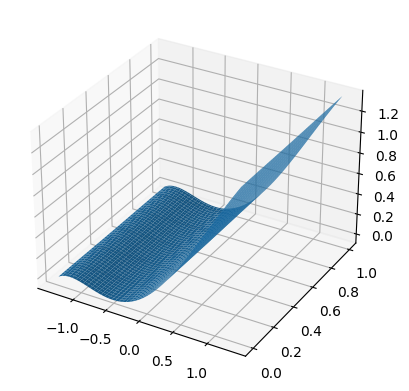


Train Epoch: 95 	Loss: 0.0066761444	Equation Loss: 0.0054607857 	 BC Loss 0.001215
Right_boundary loss 0.0002271975	Left_boundary loss 0.0000073957	Up_boundary loss 0.0009807653


Train Epoch: 95 	Loss: 0.0075436500	Equation Loss: 0.0063279481 	 BC Loss 0.001216
Right_boundary loss 0.0002270351	Left_boundary loss 0.0000058524	Up_boundary loss 0.0009828145


Train Epoch: 95 	Loss: 0.0076847849	Equation Loss: 0.0064665982 	 BC Loss 0.001218
Right_boundary loss 0.0002270233	Left_boundary loss 0.0000095747	Up_boundary loss 0.0009815887


Train Epoch: 95 	Loss: 0.0056629158	Equation Loss: 0.0044474374 	 BC Loss 0.001215
Right_boundary loss 0.0002270714	Left_boundary loss 0.0000076631	Up_boundary loss 0.0009807439



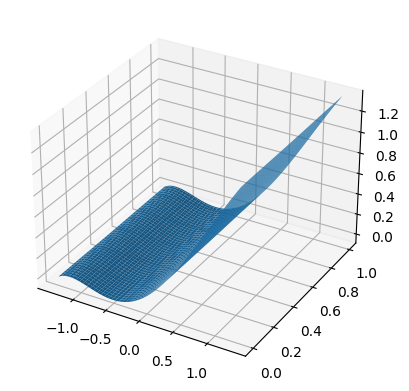


Train Epoch: 96 	Loss: 0.0071743713	Equation Loss: 0.0059613846 	 BC Loss 0.001213
Right_boundary loss 0.0002269082	Left_boundary loss 0.0000058782	Up_boundary loss 0.0009802004


Train Epoch: 96 	Loss: 0.0061135953	Equation Loss: 0.0049023400 	 BC Loss 0.001211
Right_boundary loss 0.0002268141	Left_boundary loss 0.0000053832	Up_boundary loss 0.0009790580


Train Epoch: 96 	Loss: 0.0055650179	Equation Loss: 0.0043529193 	 BC Loss 0.001212
Right_boundary loss 0.0002266052	Left_boundary loss 0.0000054790	Up_boundary loss 0.0009800144


Train Epoch: 96 	Loss: 0.0073407907	Equation Loss: 0.0061268294 	 BC Loss 0.001214
Right_boundary loss 0.0002264025	Left_boundary loss 0.0000055551	Up_boundary loss 0.0009820035



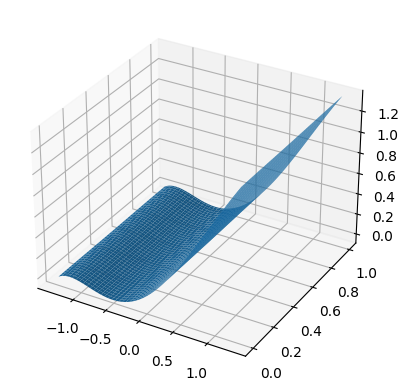


Train Epoch: 97 	Loss: 0.0048894575	Equation Loss: 0.0036755258 	 BC Loss 0.001214
Right_boundary loss 0.0002263187	Left_boundary loss 0.0000073379	Up_boundary loss 0.0009802753


Train Epoch: 97 	Loss: 0.0061905496	Equation Loss: 0.0049756989 	 BC Loss 0.001215
Right_boundary loss 0.0002262649	Left_boundary loss 0.0000108425	Up_boundary loss 0.0009777435


Train Epoch: 97 	Loss: 0.0057023587	Equation Loss: 0.0044894642 	 BC Loss 0.001213
Right_boundary loss 0.0002261271	Left_boundary loss 0.0000082824	Up_boundary loss 0.0009784851


Train Epoch: 97 	Loss: 0.0075072423	Equation Loss: 0.0062928577 	 BC Loss 0.001214
Right_boundary loss 0.0002258000	Left_boundary loss 0.0000060969	Up_boundary loss 0.0009824877



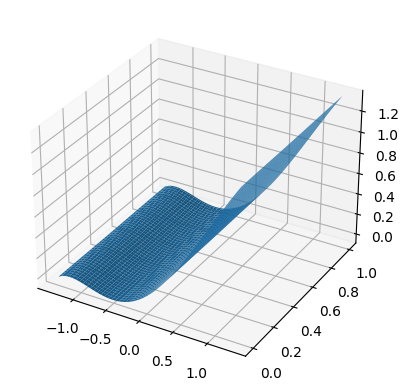


Train Epoch: 98 	Loss: 0.0061788145	Equation Loss: 0.0049659880 	 BC Loss 0.001213
Right_boundary loss 0.0002261166	Left_boundary loss 0.0000090182	Up_boundary loss 0.0009776915


Train Epoch: 98 	Loss: 0.0064591989	Equation Loss: 0.0052441191 	 BC Loss 0.001215
Right_boundary loss 0.0002259374	Left_boundary loss 0.0000100511	Up_boundary loss 0.0009790910


Train Epoch: 98 	Loss: 0.0057183700	Equation Loss: 0.0045048040 	 BC Loss 0.001214
Right_boundary loss 0.0002258545	Left_boundary loss 0.0000071200	Up_boundary loss 0.0009805918


Train Epoch: 98 	Loss: 0.0062249363	Equation Loss: 0.0050130864 	 BC Loss 0.001212
Right_boundary loss 0.0002258655	Left_boundary loss 0.0000059397	Up_boundary loss 0.0009800449



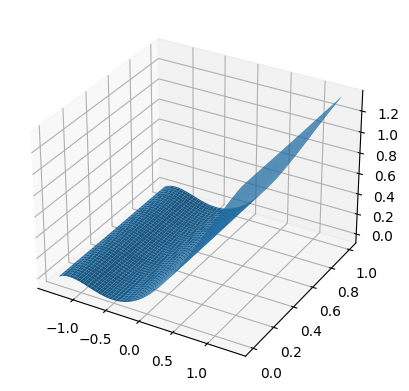


Train Epoch: 99 	Loss: 0.0072766365	Equation Loss: 0.0060637943 	 BC Loss 0.001213
Right_boundary loss 0.0002258017	Left_boundary loss 0.0000085214	Up_boundary loss 0.0009785189


Train Epoch: 99 	Loss: 0.0066609741	Equation Loss: 0.0054479698 	 BC Loss 0.001213
Right_boundary loss 0.0002256388	Left_boundary loss 0.0000056019	Up_boundary loss 0.0009817638


Train Epoch: 99 	Loss: 0.0065345559	Equation Loss: 0.0053197867 	 BC Loss 0.001215
Right_boundary loss 0.0002255333	Left_boundary loss 0.0000054279	Up_boundary loss 0.0009838081


Train Epoch: 99 	Loss: 0.0075101610	Equation Loss: 0.0062965644 	 BC Loss 0.001214
Right_boundary loss 0.0002255523	Left_boundary loss 0.0000055061	Up_boundary loss 0.0009825383



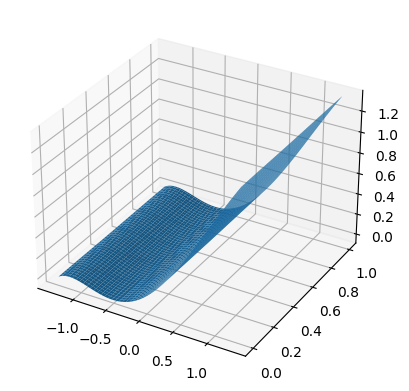

elapse time in parallel =  672.8636343479156


In [27]:
basis_num = 10
epochs = 100
learning_rate = 1e-3  

batchsize = 128 
batch_flag = True
output = train(device,x,t,x_bound,t_bound,v_bound,learning_rate,basis_num,epochs,batch_flag,batchsize)


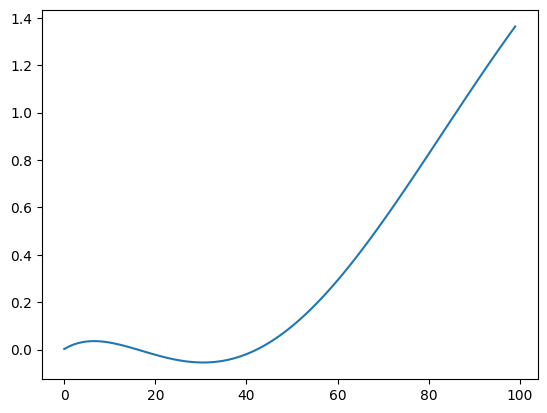

In [28]:
arr = output[1].detach().numpy()
plt.plot(arr)

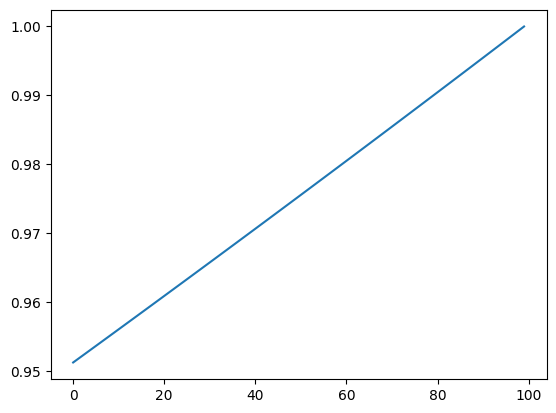

In [14]:
plt.plot(v_right)